### Problem Statement

In [133]:
## Questions
# What are the most important attributes for an Ideal Student Life ?
# What factors leads to Stress, More Participation, More Interaction, 
# More Satisfaction ?
# Does more stress leads to less satisfaction?
# What factors lead to increased stress among the students?

### Load Libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Load first dataset

In [3]:
dataset1 = pd.read_csv("Dataset/survey_responses.csv")
dataset1.head()

,Career,Citizenship,Nationality,Year since Matriculation,Year of Study,Primary Programme,Gender,Department,Housing Type,Q1-How many events have you Volunteered in ?,Q2-How many events have you Participated in ?,Q3-How many activities are you Interested in ?,Q4-How many activities are you Passionate about ?,Q5-What are your levels of stress ?,Q6-How Satisfied You are with your Student Life ?,Q7-How much effort do you make to interact with others ?,Q8-About How events are you aware about ?,response_id,Q9-What is an ideal student life ?
0,UGRD,Foreigner,Indonesia,2,2,Bachelor of Science,F,School of Science,Residences,0,1,3,1,1,2,2.0,2.0,1,NaN
1,UGRD,Country Citizen,Singapore,1,1,Bachelor of Engineering,F,School of Engineering,Out of Campus,0,1,2,3,1,2,2.0,3.0,2,Friends+CCas+good result
2,UGRD,Foreigner,Malaysia,2,2,Bachelor of Science,M,School of Science,Halls,3,1,1,5,2,2,2.0,2.0,3,just want everything to go smooth. serious
3,UGRD,Foreigner,Malaysia,2,2,Bachelor of Engineering,M,School of Engineering,Halls,3,4,3,3,7,1,1.0,1.0,4,NaN
4,UGRD,Foreigner,Viet Nam,3,3,Bachelor of Engineering,F,School of Engineering,Out of Campus,4,3,4,5,4,2,2.0,2.0,5,a mixture of both academic and non-academic


### Load second dataset

In [4]:
dataset2 = pd.read_csv("Dataset\survey_questions_meta.csv")
dataset2.head()

,Q1-Volunteered For Animal welfare,Q1-Volunteered For Arts/Culture/Heritage,Q1-Volunteered For Children/Youth,Q1-Volunteered For Community building,Q1-Volunteered For Diversity & Inclusion,Q1-Volunteered For Environmental sustainability,Q1-Volunteered For Families,Q1-Volunteered For Health/Well-being (e.g mental health),Q1-Volunteered For Seniors,Q1-Volunteered For Poverty reduction,...,Q5-Stressed about Academic issues,Q5-Stressed about Financial issues,Q5-Stressed about Family issues,Q5-Stressed about Friendships,Q5-Stressed about Romantic relationships,Q5-Stressed about Health related issues,Q5-Stressed about Career related issues,"Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.",Q5-Stressed about Others,response_id
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Yes,No,No,No,No,No,No,No,No,1
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Yes,No,No,No,No,No,No,No,No,2
2,No,No,No,Yes,No,No,No,Yes,No,No,...,Yes,No,No,No,No,No,Yes,No,No,3
3,No,Yes,Yes,Yes,No,No,No,No,No,No,...,Yes,No,Yes,Yes,Yes,Yes,No,Yes,No,4
4,No,No,Yes,Yes,No,No,No,No,Yes,No,...,Yes,Yes,No,Yes,No,No,No,Yes,No,5


### Merge two dataset 

In [5]:
dataset = pd.concat([dataset1, dataset2], axis = 1)
dataset

,Career,Citizenship,Nationality,Year since Matriculation,Year of Study,Primary Programme,Gender,Department,Housing Type,Q1-How many events have you Volunteered in ?,...,Q5-Stressed about Academic issues,Q5-Stressed about Financial issues,Q5-Stressed about Family issues,Q5-Stressed about Friendships,Q5-Stressed about Romantic relationships,Q5-Stressed about Health related issues,Q5-Stressed about Career related issues,"Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.",Q5-Stressed about Others,response_id
0,UGRD,Foreigner,Indonesia,2,2,Bachelor of Science,F,School of Science,Residences,0,...,Yes,No,No,No,No,No,No,No,No,1
1,UGRD,Country Citizen,Singapore,1,1,Bachelor of Engineering,F,School of Engineering,Out of Campus,0,...,Yes,No,No,No,No,No,No,No,No,2
2,UGRD,Foreigner,Malaysia,2,2,Bachelor of Science,M,School of Science,Halls,3,...,Yes,No,No,No,No,No,Yes,No,No,3
3,UGRD,Foreigner,Malaysia,2,2,Bachelor of Engineering,M,School of Engineering,Halls,3,...,Yes,No,Yes,Yes,Yes,Yes,No,Yes,No,4
4,UGRD,Foreigner,Viet Nam,3,3,Bachelor of Engineering,F,School of Engineering,Out of Campus,4,...,Yes,Yes,No,Yes,No,No,No,Yes,No,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2953,UGRD,Country Citizen,Singapore,1,1,Bachelor of Science,F,School of Science,Out of Campus,0,...,Yes,Yes,No,No,Yes,No,No,No,No,2954
2954,UGRD,Country Citizen,Singapore,2,2,"Bach. of Med.,Bach. of Surg.",M,School of Medicine1,Out of Campus,1,...,Yes,No,No,No,No,No,No,No,No,2955
2955,GRAD,Foreigner,China,1,1,Master of Science (Track 1),F,School of Science,Out of Campus,0,...,Yes,No,No,No,No,No,No,No,No,2956
2956,GRAD,Foreigner,China,4,4,Doctor of Philosophy (FoE),M,School of Engineering,Out of Campus,3,...,Yes,No,No,No,No,Yes,Yes,No,No,2957


### Get the general information of all datapoints

In [138]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2958 entries, 0 to 2957
Data columns (total 68 columns):
 #   Column                                                                                                                      Non-Null Count  Dtype  
---  ------                                                                                                                      --------------  -----  
 0   Career                                                                                                                      2958 non-null   object 
 1   Citizenship                                                                                                                 2958 non-null   object 
 2   Nationality                                                                                                                 2958 non-null   object 
 3   Year since Matriculation                                                                                                   

### Remove Unwanted features

In [139]:

dataset.drop(['response_id'], axis = 1, inplace = True)

### Statistical information of numeric features

In [140]:
dataset.describe()

,Year since Matriculation,Year of Study,Q1-How many events have you Volunteered in ?,Q2-How many events have you Participated in ?,Q3-How many activities are you Interested in ?,Q4-How many activities are you Passionate about ?,Q5-What are your levels of stress ?,Q6-How Satisfied You are with your Student Life ?,Q7-How much effort do you make to interact with others ?,Q8-About How events are you aware about ?
count,2958.000000,2958.000000,2958.000000,2958.000000,2958.000000,2958.000000,2958.000000,2958.000000,2940.000000,2940.000000
mean,2.207235,2.206220,1.248141,1.493577,2.733942,3.184246,3.091954,1.925287,1.963265,2.082993
std,1.102763,1.099729,1.480097,0.958274,1.269236,1.969894,1.653537,0.562162,0.575096,0.642636
min,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,1.000000,1.000000,0.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
50%,2.000000,2.000000,1.000000,1.000000,3.000000,3.000000,3.000000,2.000000,2.000000,2.000000
75%,3.000000,3.000000,2.000000,2.000000,3.000000,4.000000,4.000000,2.000000,2.000000,2.000000
max,6.000000,5.000000,11.000000,5.000000,8.000000,11.000000,9.000000,3.000000,3.000000,4.000000


### Missing data checking

In [141]:
## Missing data 
#
nan_percentage = [(clm_names, dataset[clm_names].isna().mean() * 100) for clm_names in dataset]
nan_percentage = pd.DataFrame(nan_percentage, columns = ['columns', 'nan_percentages'])
nan_percentage

,columns,nan_percentages
0,Career,0.0
1,Citizenship,0.0
2,Nationality,0.0
3,Year since Matriculation,0.0
4,Year of Study,0.0
...,...,...
61,Q5-Stressed about Romantic relationships,0.0
62,Q5-Stressed about Health related issues,0.0
63,Q5-Stressed about Career related issues,0.0
64,"Q5-Stressed about My involvement in hostel, cl...",0.0


### Checking duplicate data points

In [143]:
# Check duplicate
print(dataset.duplicated().sum())
dataset.drop_duplicates(keep = 'first', inplace = True)
print(dataset.duplicated().sum())

0
0


### Summarization

### Count each category inside each feature

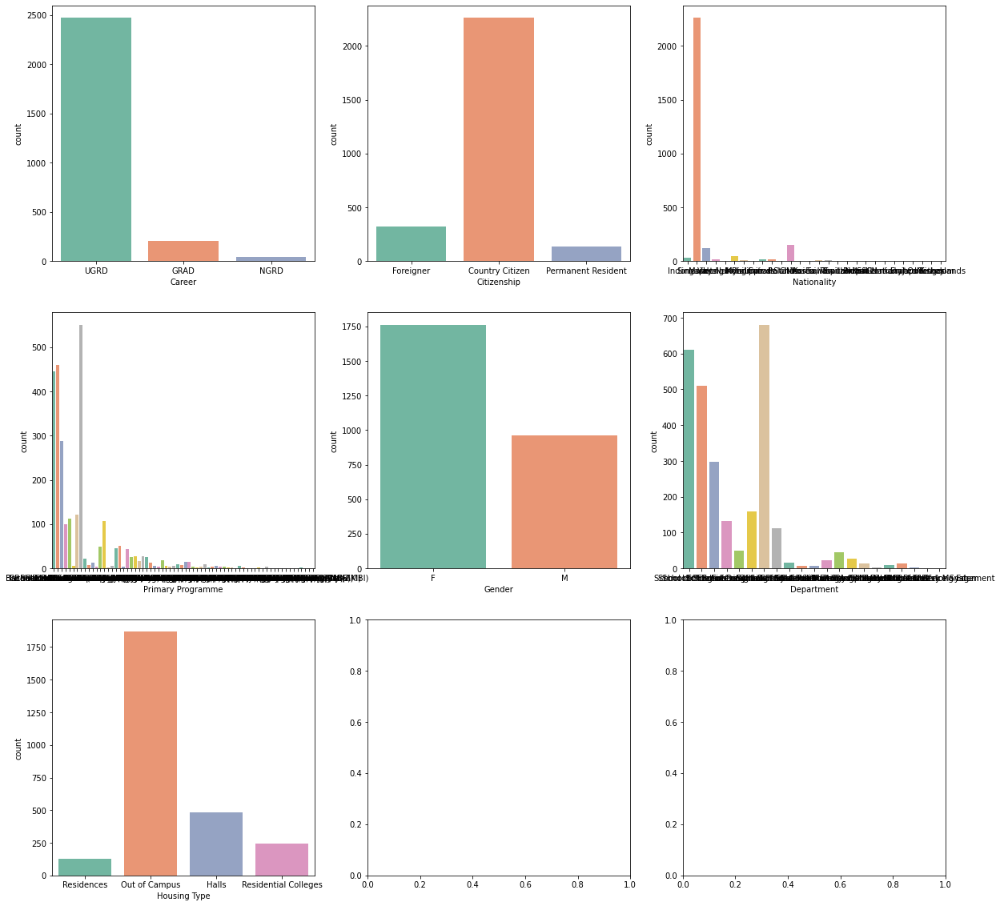

In [223]:
## Just look at the graphs and you will find you answers
fig, ax = plt.subplots(3,3, figsize=(20, 20))
sns.countplot(x ='Career', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Citizenship', data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Nationality', data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Primary Programme', data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Gender', data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Department', data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Housing Type', data = dataset, palette = "Set2", ax=ax[2, 0])

plt.show()
plt.close()

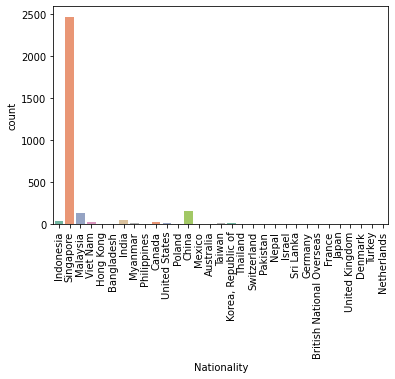

In [146]:
## For better view
sns.countplot(x ='Nationality', data = dataset, palette = "Set2")
plt.xticks(rotation = 90)
plt.show()
plt.close()

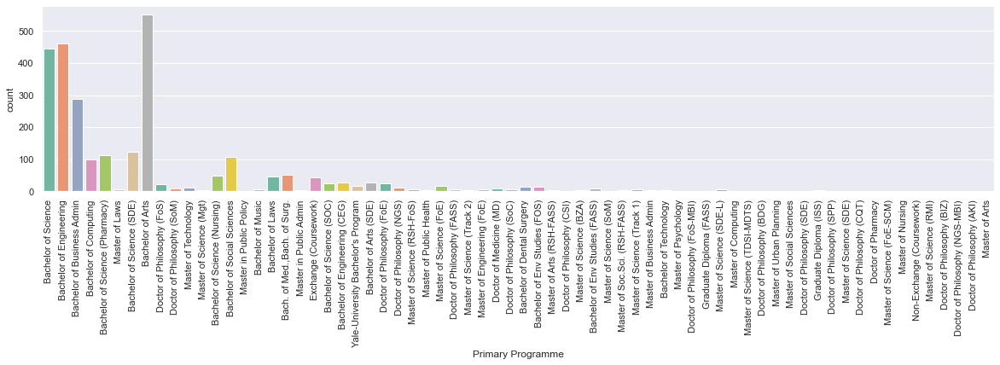

In [225]:
## For better view
sns.countplot(x ='Primary Programme', data = dataset, palette = "Set2")
sns.set(rc={"figure.figsize":(20, 4)}) 
plt.xticks(rotation = 90)
plt.show()
plt.close()


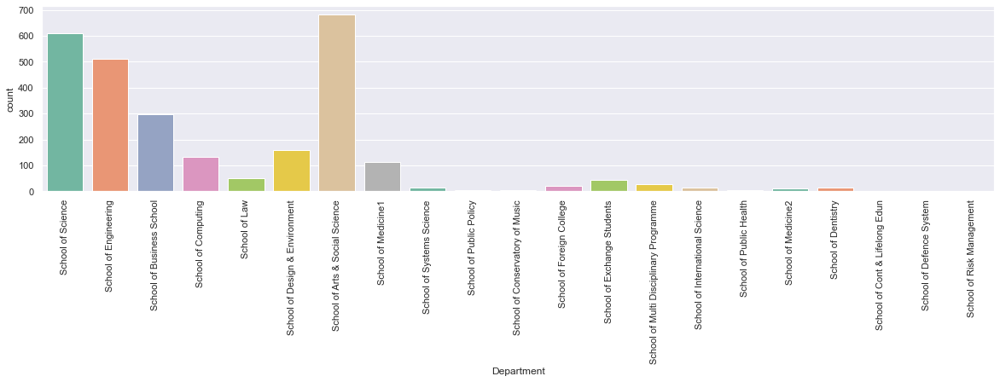

In [226]:
## For better view
sns.countplot(x ='Department', data = dataset, palette = "Set2")
plt.xticks(rotation = 90)
plt.show()
plt.close()

### Compare each feature with stress

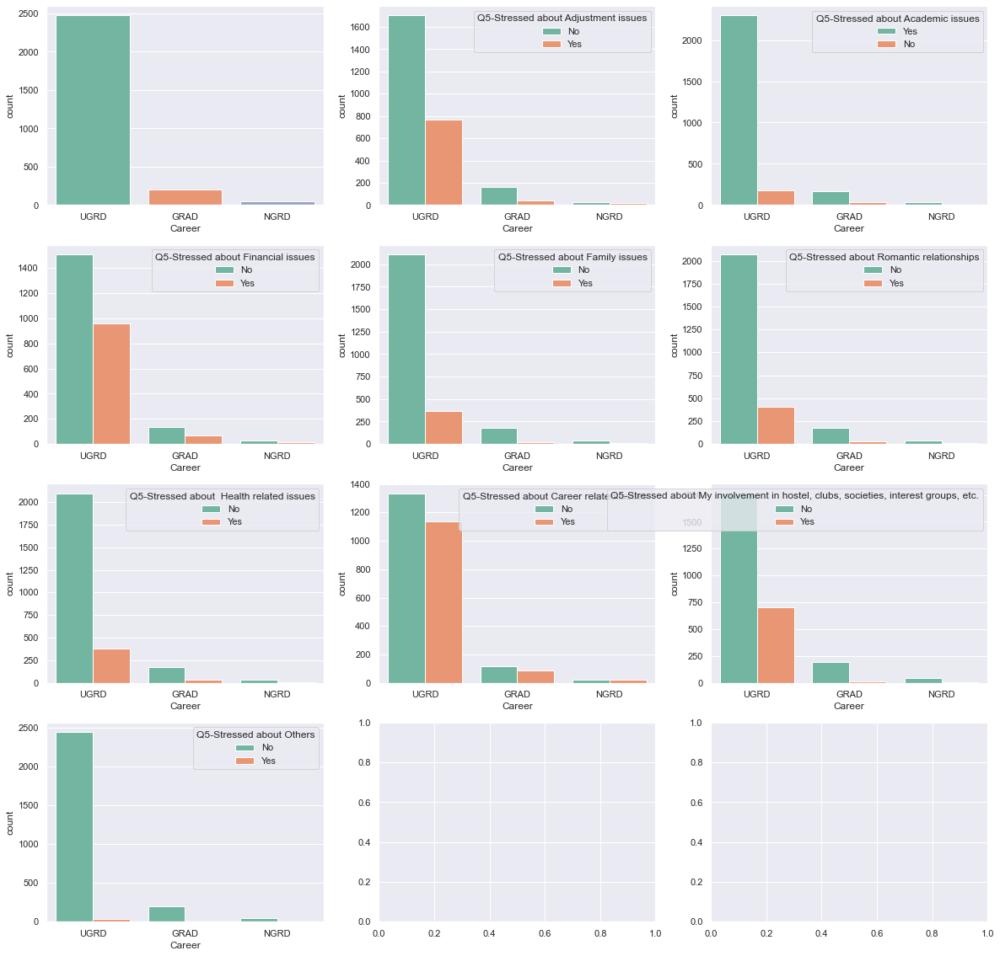

In [228]:
## Just observe graph for answers
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Career', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Career', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Career', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Career', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Career', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Career', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Career', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Career', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Career', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Career', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



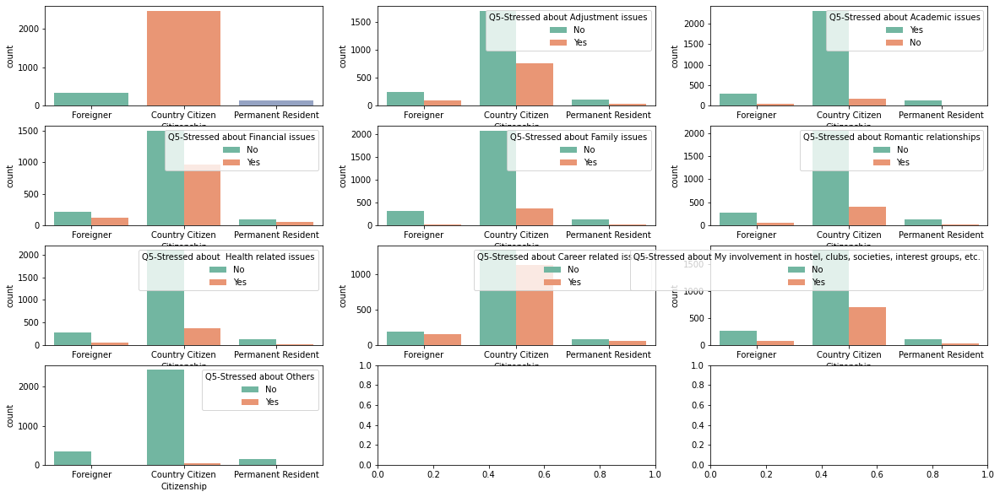

In [155]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Citizenship', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Citizenship', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Citizenship', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Citizenship', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Citizenship', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Citizenship', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Citizenship', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Citizenship', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Citizenship', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Citizenship', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



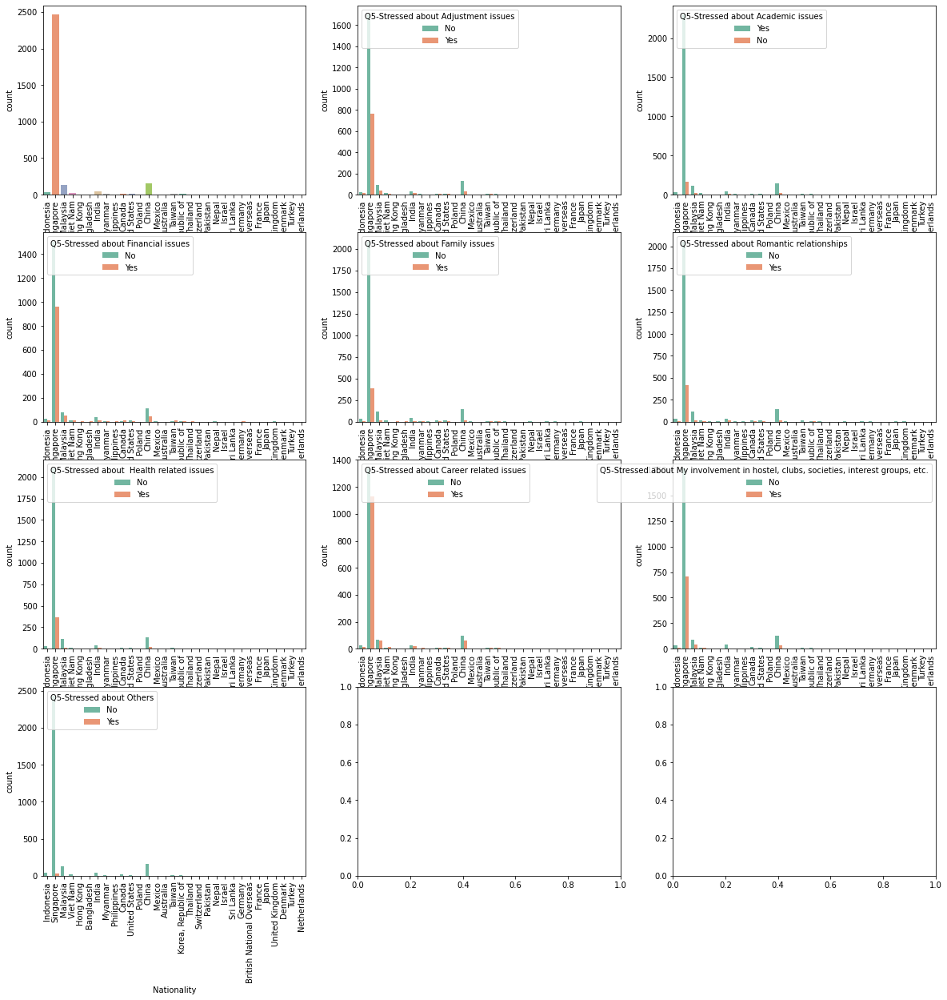

In [156]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Nationality', data = dataset, palette = "Set2", ax=ax[0,0]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Nationality', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Nationality', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Nationality', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Nationality', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Nationality', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Nationality', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Nationality', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Nationality', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Nationality', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0]).tick_params(axis='x', rotation=90)

plt.show()
plt.close()



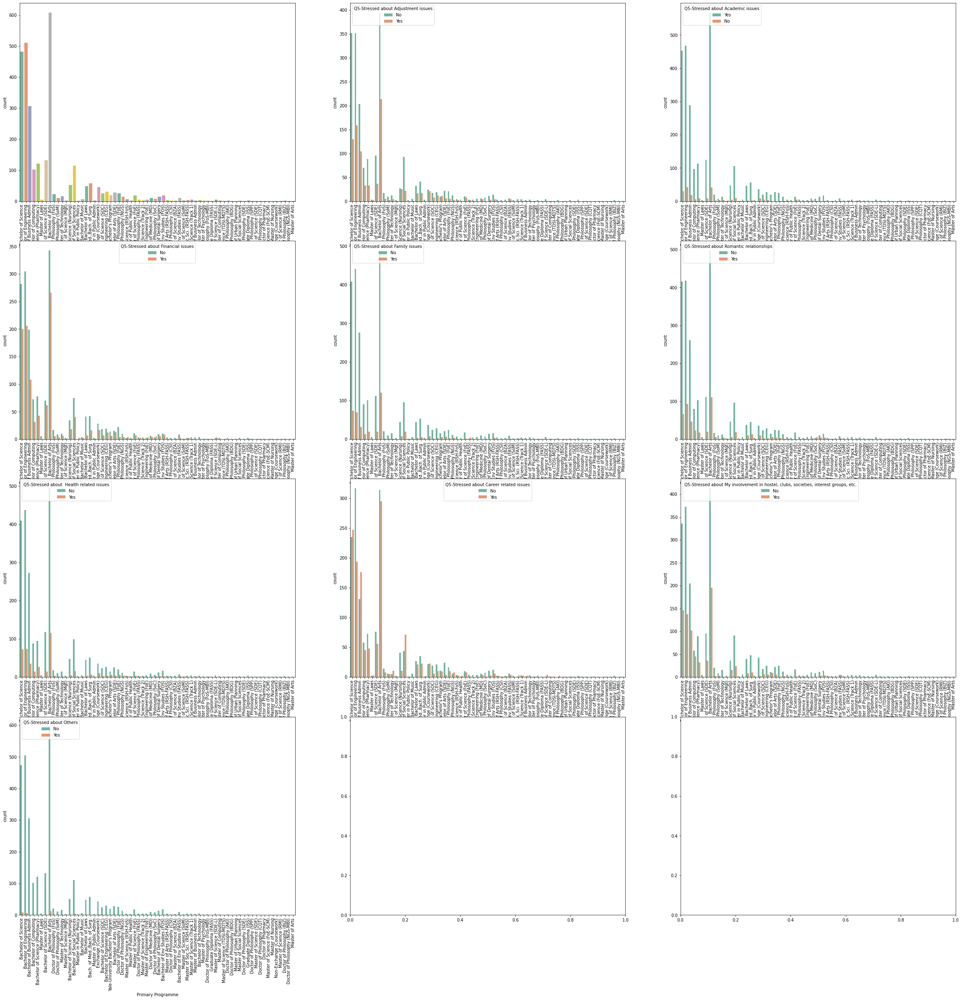

In [157]:
fig, ax = plt.subplots(4,3, figsize=(40, 40))
sns.countplot(x ='Primary Programme', data = dataset, palette = "Set2", ax=ax[0,0]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Primary Programme', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Primary Programme', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Primary Programme', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Primary Programme', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Primary Programme', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Primary Programme', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Primary Programme', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Primary Programme', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Primary Programme', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0]).tick_params(axis='x', rotation=90)

plt.show()
plt.close()



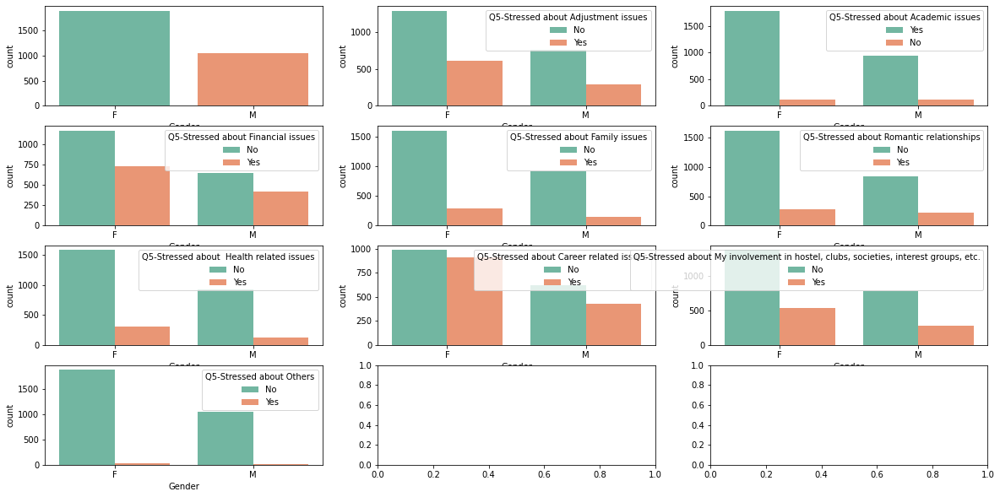

In [158]:
fig, ax = plt.subplots(4,3, figsize=(20, 10))
sns.countplot(x ='Gender', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Gender', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Gender', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Gender', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Gender', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Gender', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Gender', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Gender', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Gender', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Gender', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



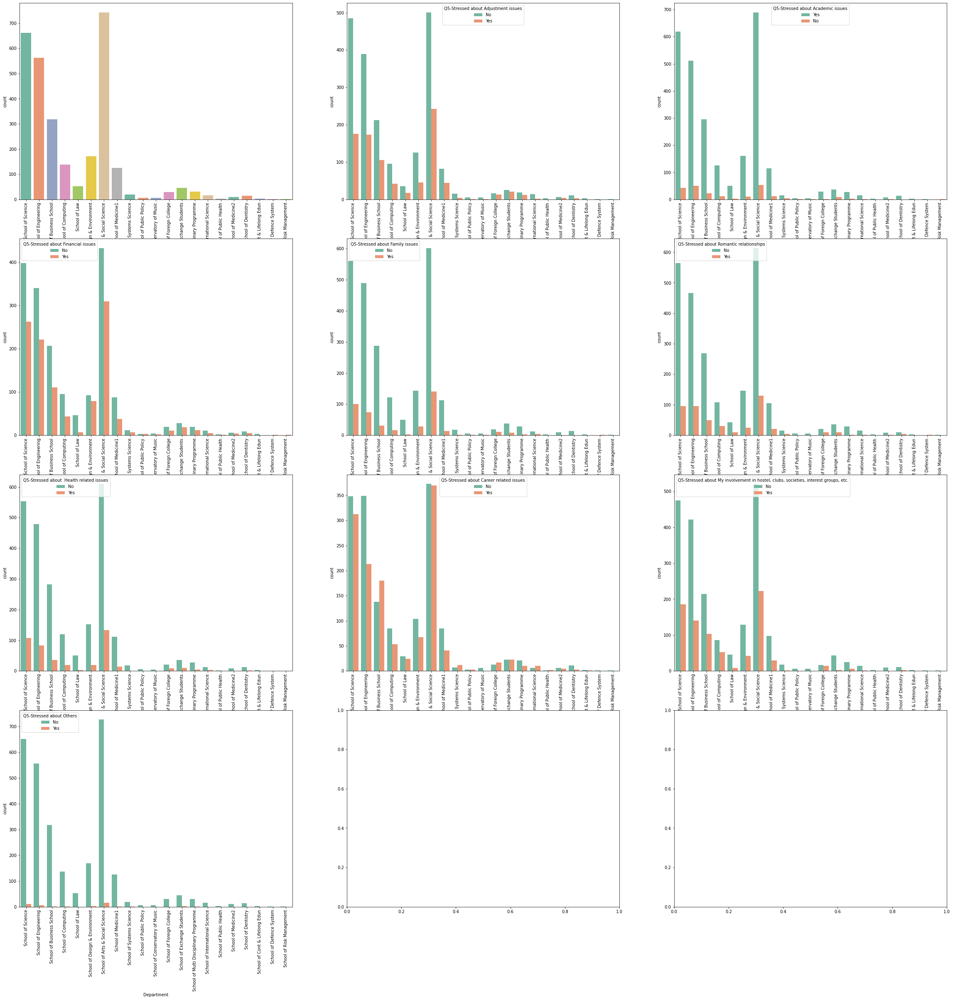

In [159]:
fig, ax = plt.subplots(4,3, figsize=(40, 40))
sns.countplot(x ='Department', data = dataset, palette = "Set2", ax=ax[0,0]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Department', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Department', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Department', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Department', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Department', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Department', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Department', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Department', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Department', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0]).tick_params(axis='x', rotation=90)

plt.show()
plt.close()



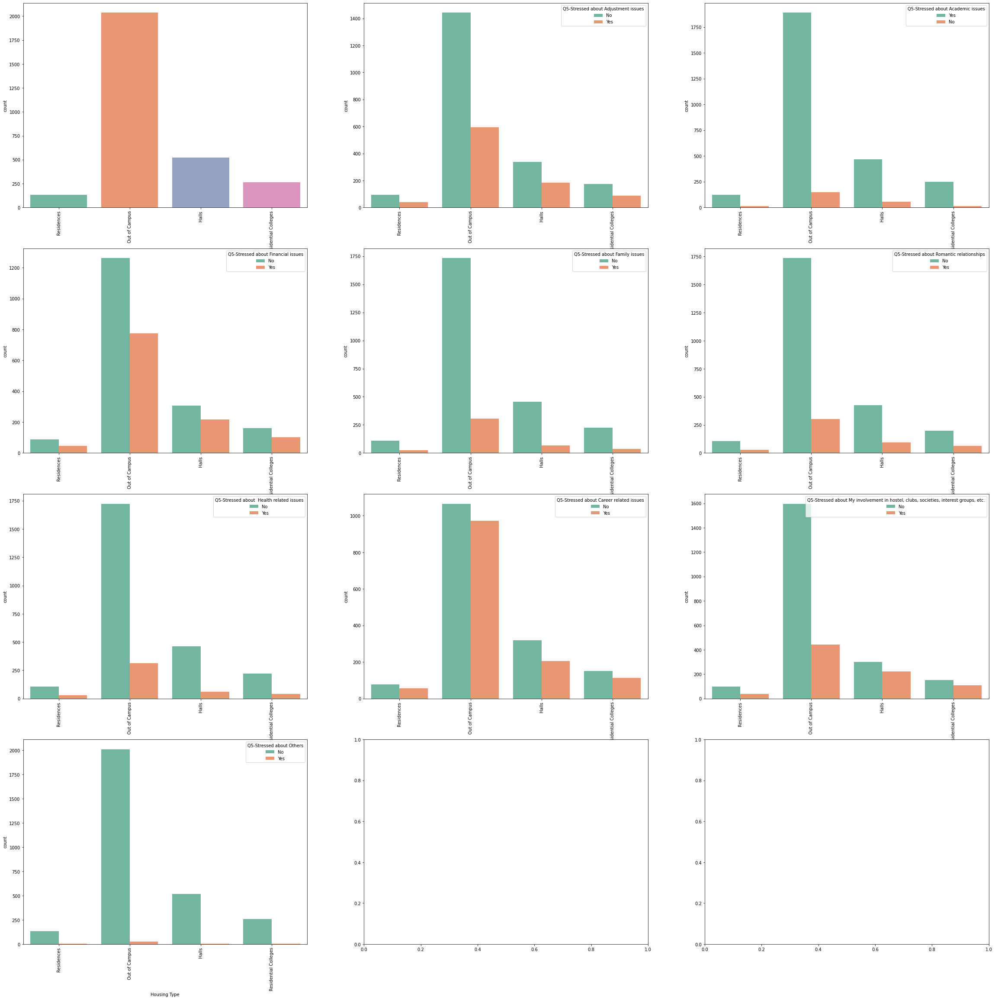

In [160]:
fig, ax = plt.subplots(4,3, figsize=(40, 40))
sns.countplot(x ='Housing Type', data = dataset, palette = "Set2", ax=ax[0,0]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Housing Type', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Housing Type', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Housing Type', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Housing Type', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Housing Type', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Housing Type', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Housing Type', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Housing Type', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2]).tick_params(axis='x', rotation=90)
sns.countplot(x ='Housing Type', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0]).tick_params(axis='x', rotation=90)

plt.show()
plt.close()



### Compare Participation with Stress

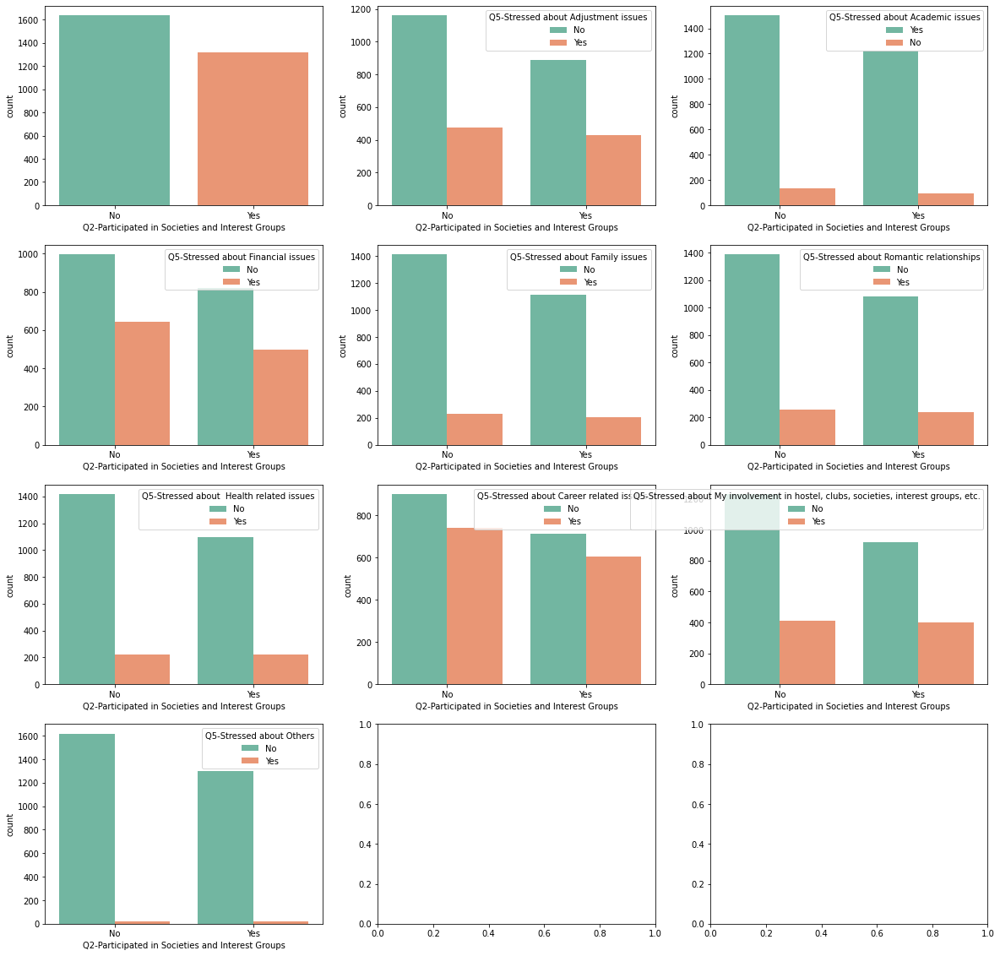

In [161]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q2-Participated in Societies and Interest Groups', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q2-Participated in Societies and Interest Groups', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q2-Participated in Societies and Interest Groups', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q2-Participated in Societies and Interest Groups', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q2-Participated in Societies and Interest Groups', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q2-Participated in Societies and Interest Groups', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q2-Participated in Societies and Interest Groups', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q2-Participated in Societies and Interest Groups', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q2-Participated in Societies and Interest Groups', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q2-Participated in Societies and Interest Groups', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()

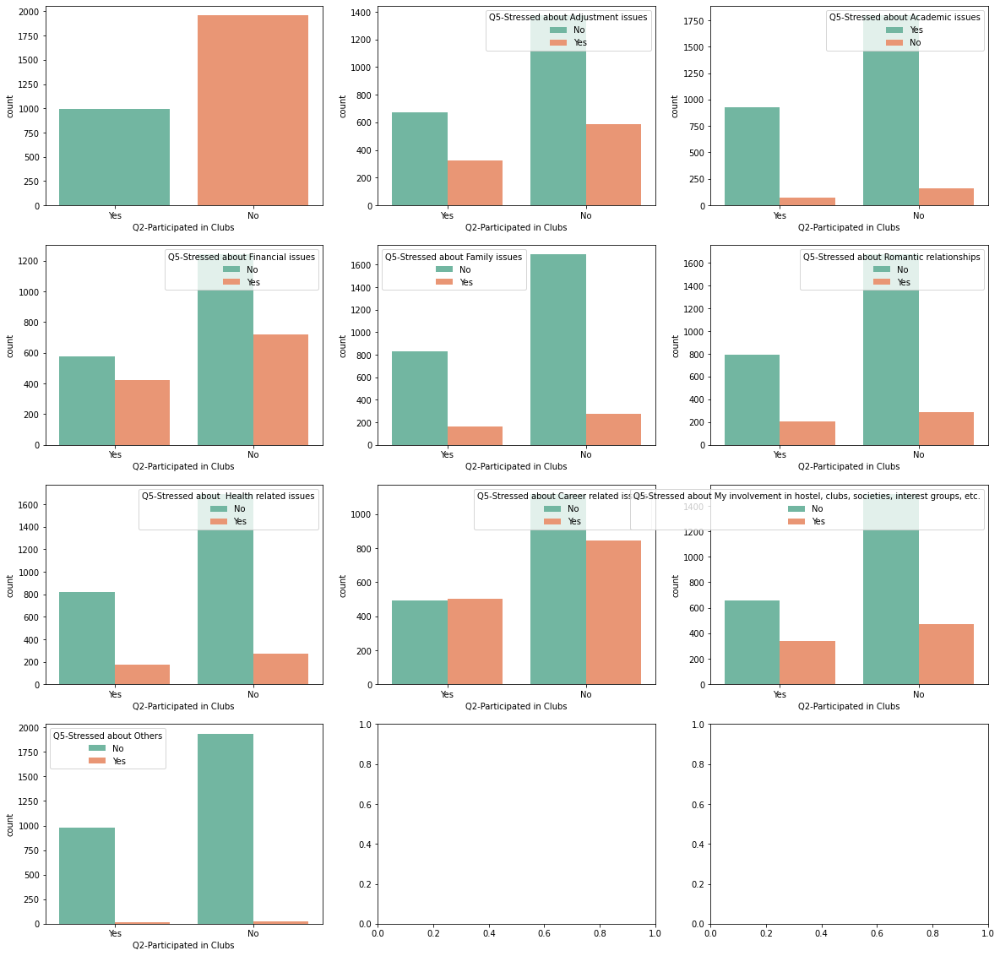

In [162]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q2-Participated in Clubs', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q2-Participated in Clubs', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q2-Participated in Clubs', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q2-Participated in Clubs', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q2-Participated in Clubs', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q2-Participated in Clubs', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q2-Participated in Clubs', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q2-Participated in Clubs', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q2-Participated in Clubs', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q2-Participated in Clubs', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()

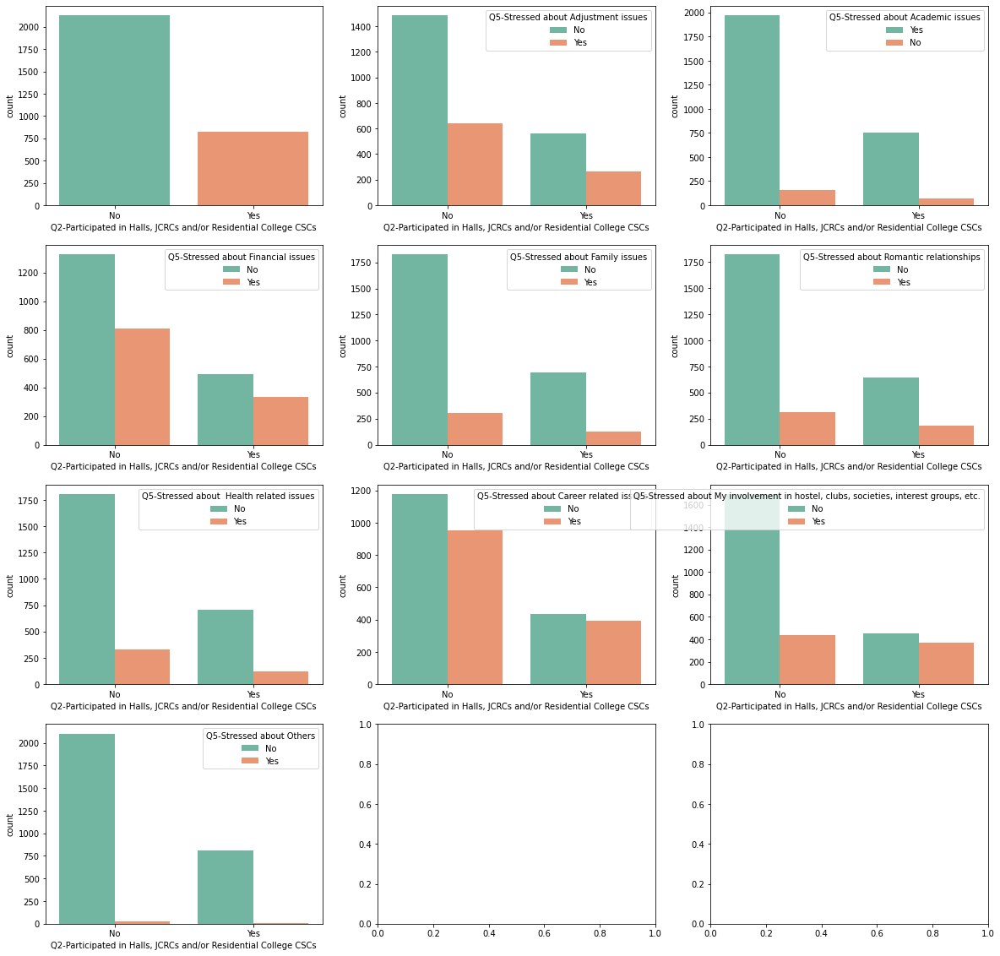

In [163]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q2-Participated in Halls, JCRCs and/or Residential College CSCs', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q2-Participated in Halls, JCRCs and/or Residential College CSCs', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q2-Participated in Halls, JCRCs and/or Residential College CSCs', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q2-Participated in Halls, JCRCs and/or Residential College CSCs', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q2-Participated in Halls, JCRCs and/or Residential College CSCs', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q2-Participated in Halls, JCRCs and/or Residential College CSCs', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q2-Participated in Halls, JCRCs and/or Residential College CSCs', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q2-Participated in Halls, JCRCs and/or Residential College CSCs', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q2-Participated in Halls, JCRCs and/or Residential College CSCs', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q2-Participated in Halls, JCRCs and/or Residential College CSCs', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



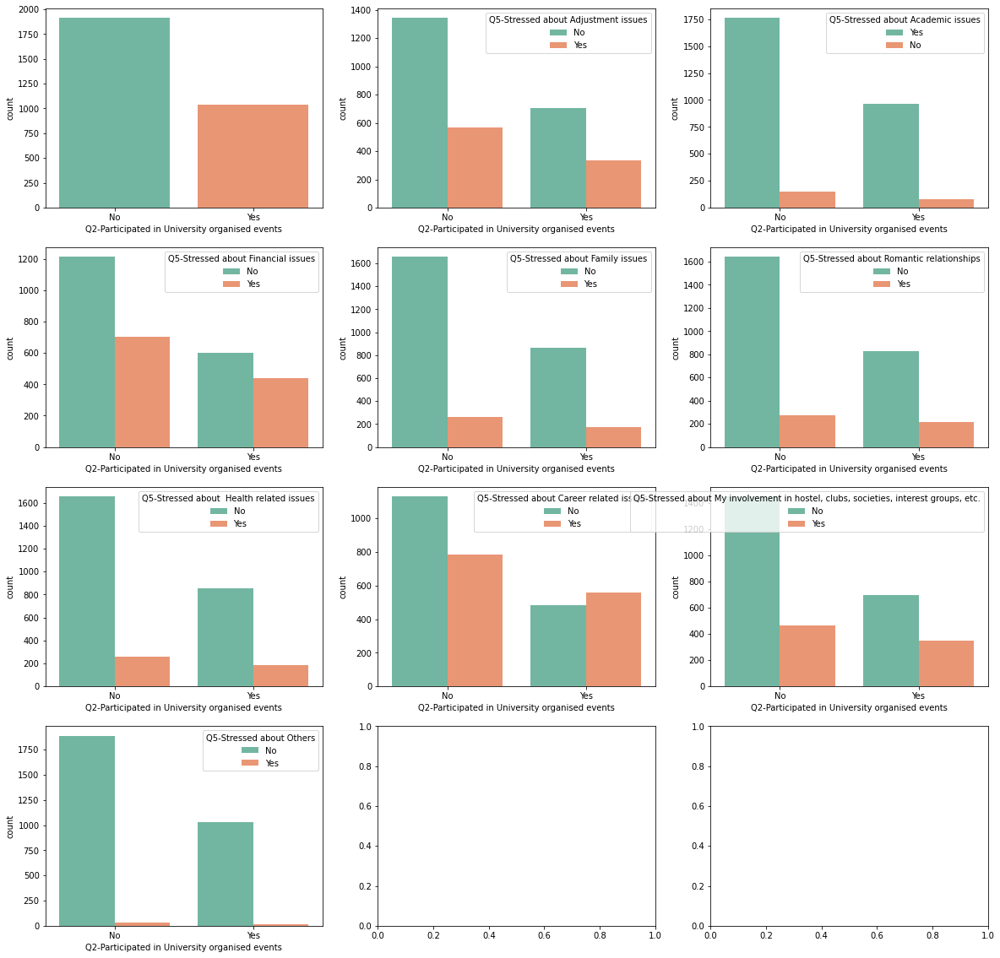

In [164]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q2-Participated in University organised events', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q2-Participated in University organised events', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q2-Participated in University organised events', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q2-Participated in University organised events', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q2-Participated in University organised events', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q2-Participated in University organised events', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q2-Participated in University organised events', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q2-Participated in University organised events', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q2-Participated in University organised events', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q2-Participated in University organised events', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()

In [7]:
dataset[(dataset["Q2-Participated in Others"]== "Yes") | (dataset["Q2-Participated in Others"] == "No")]

,Career,Citizenship,Nationality,Year since Matriculation,Year of Study,Primary Programme,Gender,Department,Housing Type,Q1-How many events have you Volunteered in ?,...,Q5-Stressed about Academic issues,Q5-Stressed about Financial issues,Q5-Stressed about Family issues,Q5-Stressed about Friendships,Q5-Stressed about Romantic relationships,Q5-Stressed about Health related issues,Q5-Stressed about Career related issues,"Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.",Q5-Stressed about Others,response_id
0,UGRD,Foreigner,Indonesia,2,2,Bachelor of Science,F,School of Science,Residences,0,...,Yes,No,No,No,No,No,No,No,No,1
1,UGRD,Country Citizen,Singapore,1,1,Bachelor of Engineering,F,School of Engineering,Out of Campus,0,...,Yes,No,No,No,No,No,No,No,No,2
2,UGRD,Foreigner,Malaysia,2,2,Bachelor of Science,M,School of Science,Halls,3,...,Yes,No,No,No,No,No,Yes,No,No,3
3,UGRD,Foreigner,Malaysia,2,2,Bachelor of Engineering,M,School of Engineering,Halls,3,...,Yes,No,Yes,Yes,Yes,Yes,No,Yes,No,4
4,UGRD,Foreigner,Viet Nam,3,3,Bachelor of Engineering,F,School of Engineering,Out of Campus,4,...,Yes,Yes,No,Yes,No,No,No,Yes,No,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2953,UGRD,Country Citizen,Singapore,1,1,Bachelor of Science,F,School of Science,Out of Campus,0,...,Yes,Yes,No,No,Yes,No,No,No,No,2954
2954,UGRD,Country Citizen,Singapore,2,2,"Bach. of Med.,Bach. of Surg.",M,School of Medicine1,Out of Campus,1,...,Yes,No,No,No,No,No,No,No,No,2955
2955,GRAD,Foreigner,China,1,1,Master of Science (Track 1),F,School of Science,Out of Campus,0,...,Yes,No,No,No,No,No,No,No,No,2956
2956,GRAD,Foreigner,China,4,4,Doctor of Philosophy (FoE),M,School of Engineering,Out of Campus,3,...,Yes,No,No,No,No,Yes,Yes,No,No,2957


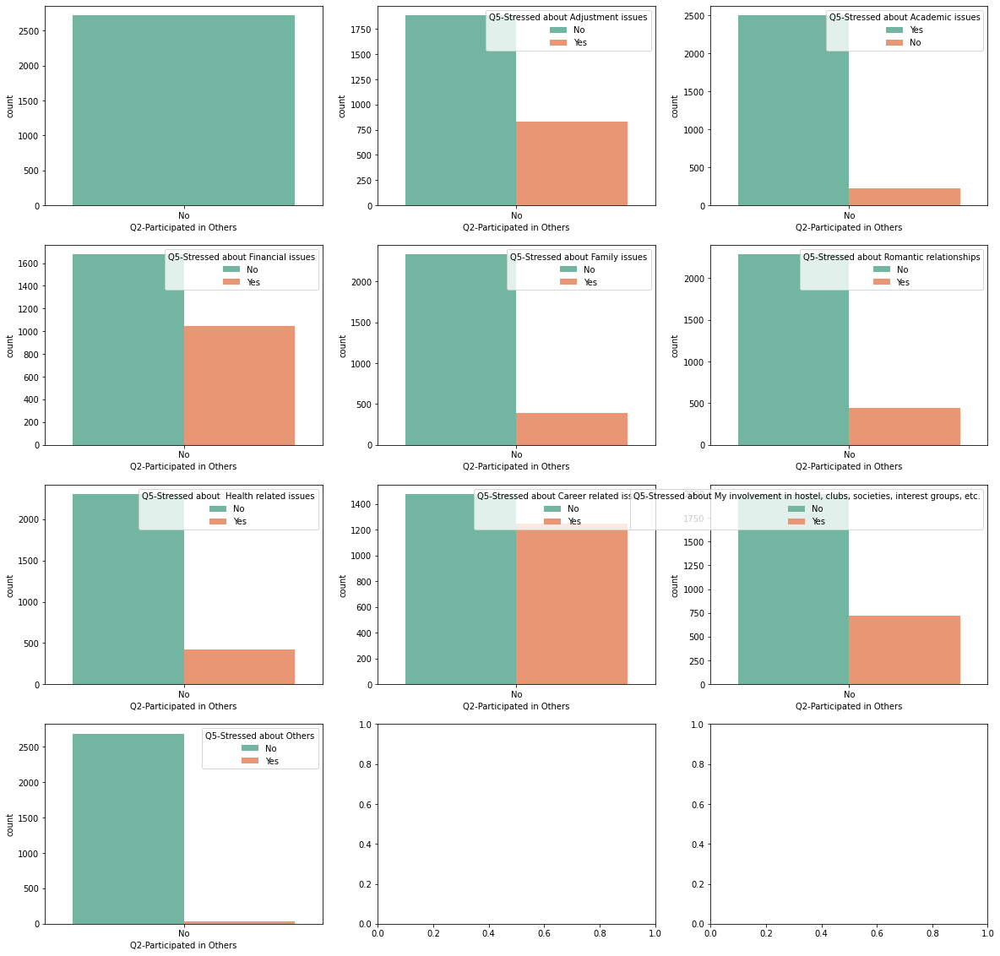

In [176]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q2-Participated in Others', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q2-Participated in Others', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q2-Participated in Others', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q2-Participated in Others', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q2-Participated in Others', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q2-Participated in Others', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q2-Participated in Others', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q2-Participated in Others', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q2-Participated in Others', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q2-Participated in Others', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



### Compare Interest with Stress

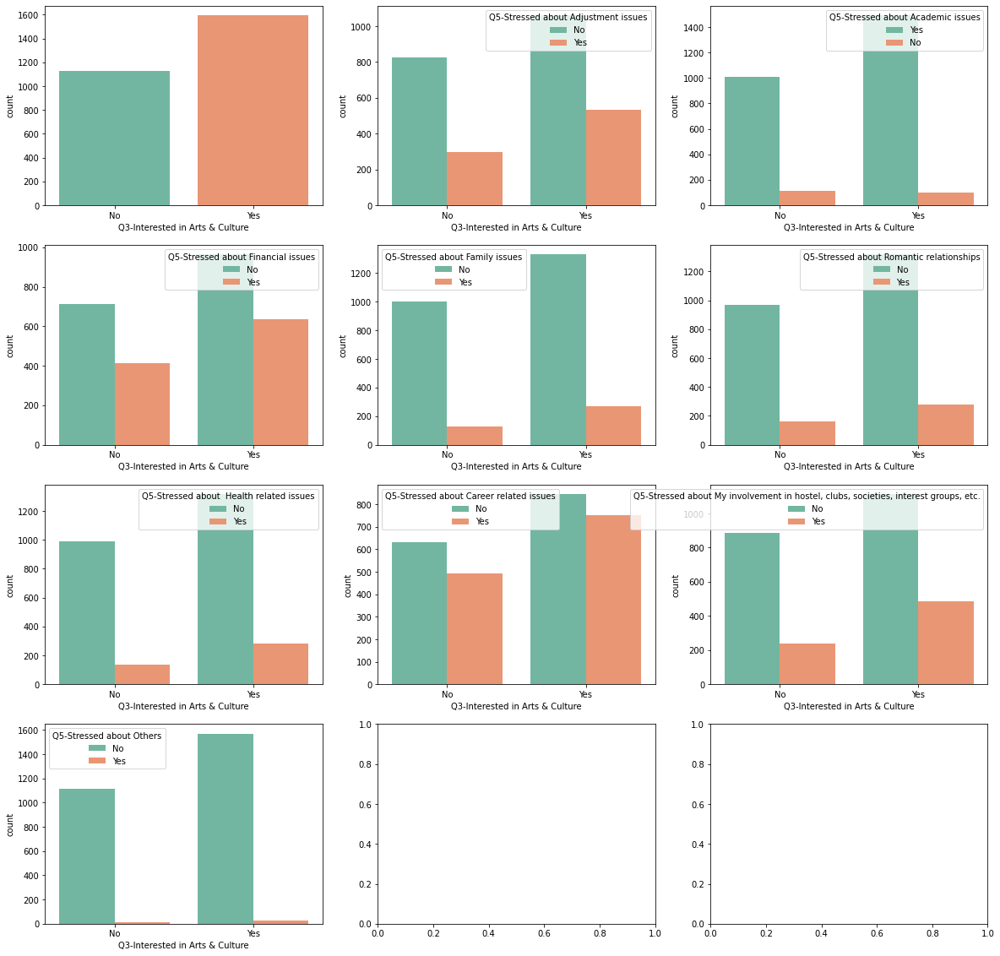

In [181]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q3-Interested in Arts & Culture', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q3-Interested in Arts & Culture', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q3-Interested in Arts & Culture', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q3-Interested in Arts & Culture', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q3-Interested in Arts & Culture', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q3-Interested in Arts & Culture', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q3-Interested in Arts & Culture', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q3-Interested in Arts & Culture', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q3-Interested in Arts & Culture', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q3-Interested in Arts & Culture', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



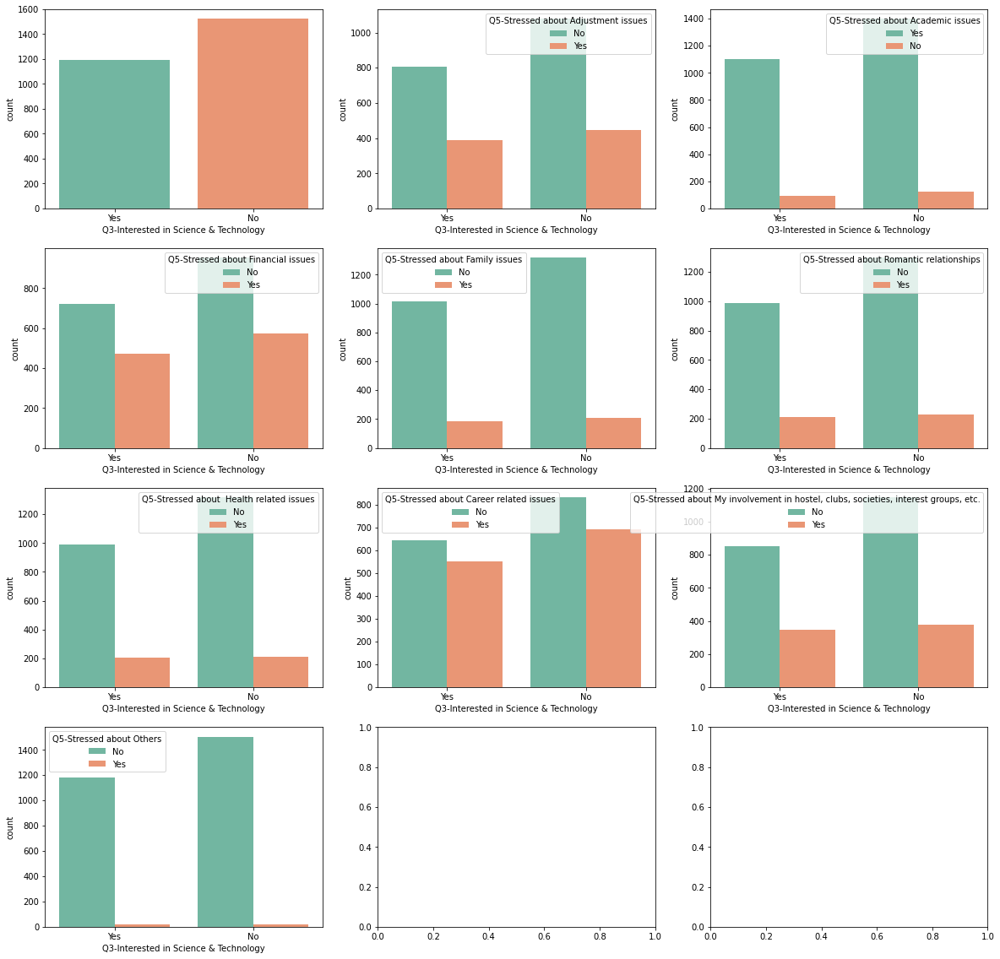

In [182]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q3-Interested in Science & Technology', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q3-Interested in Science & Technology', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q3-Interested in Science & Technology', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q3-Interested in Science & Technology', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q3-Interested in Science & Technology', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q3-Interested in Science & Technology', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q3-Interested in Science & Technology', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q3-Interested in Science & Technology', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q3-Interested in Science & Technology', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q3-Interested in Science & Technology', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



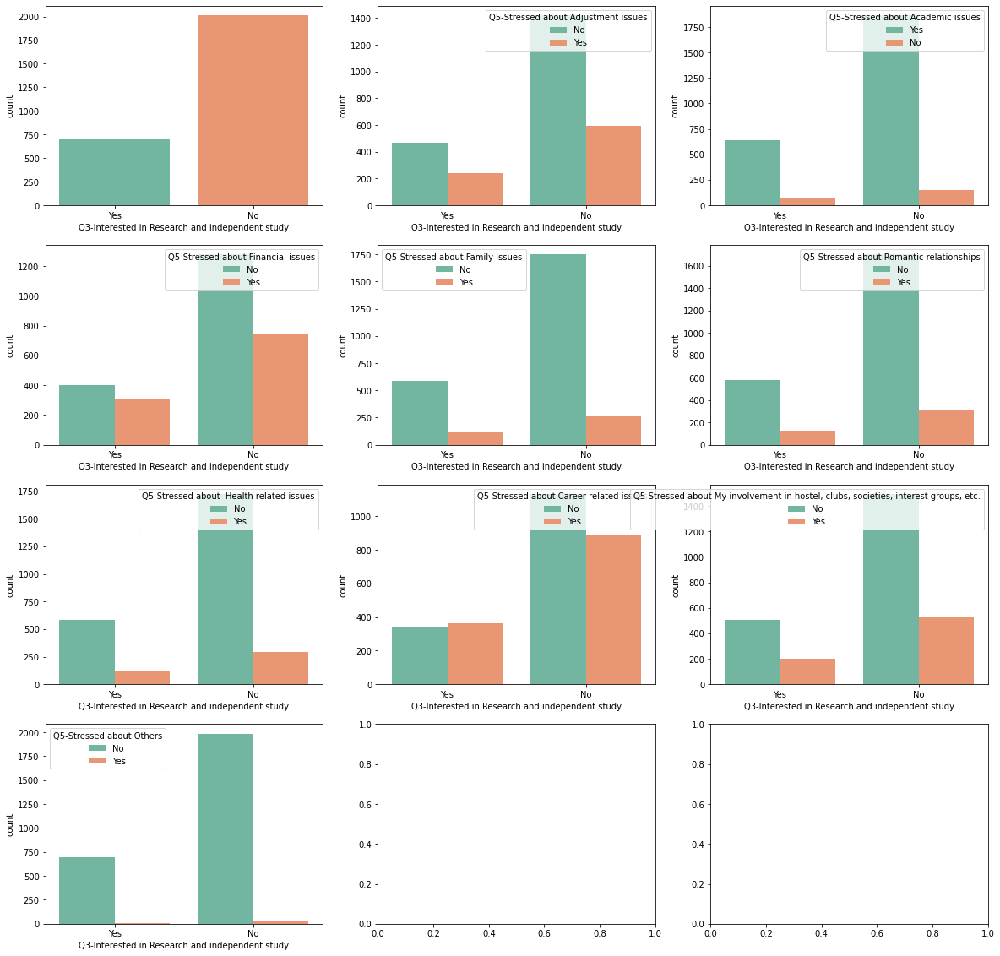

In [184]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q3-Interested in Research and independent study', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q3-Interested in Research and independent study', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q3-Interested in Research and independent study', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q3-Interested in Research and independent study', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q3-Interested in Research and independent study', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q3-Interested in Research and independent study', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q3-Interested in Research and independent study', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q3-Interested in Research and independent study', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q3-Interested in Research and independent study', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q3-Interested in Research and independent study', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



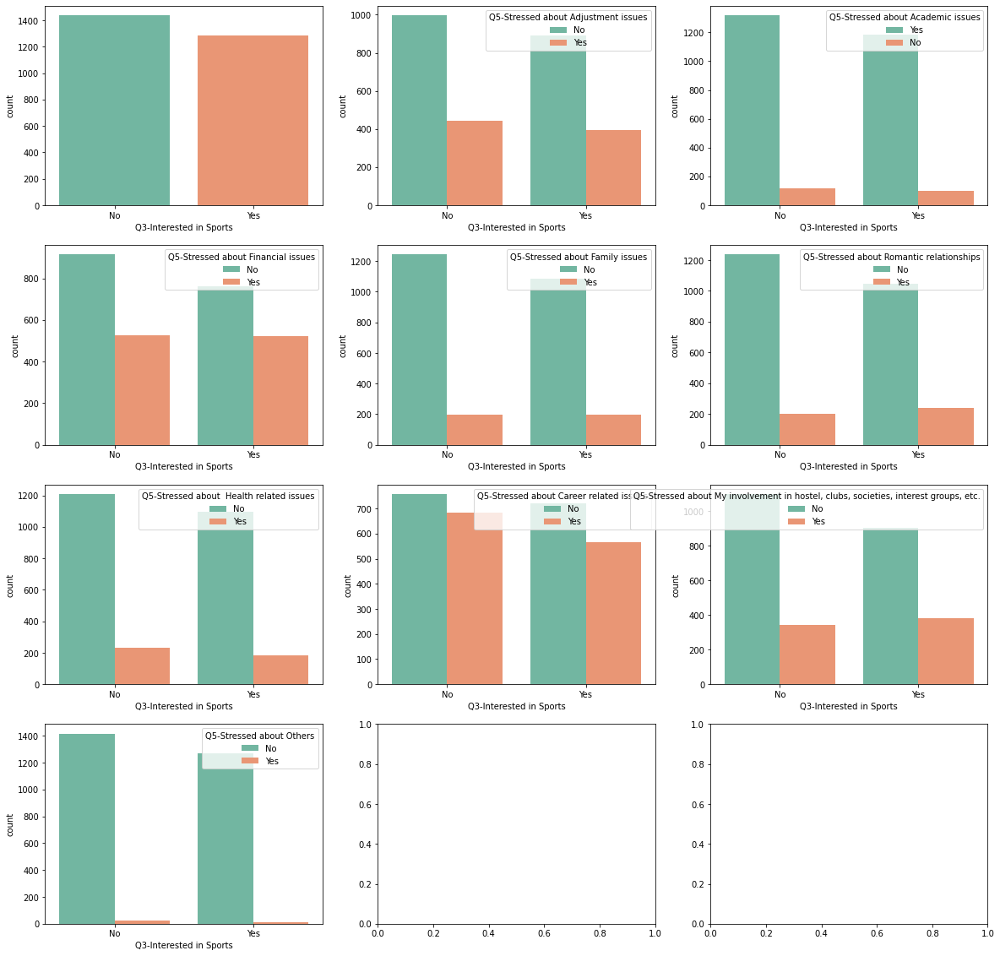

In [185]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q3-Interested in Sports', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q3-Interested in Sports', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q3-Interested in Sports', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q3-Interested in Sports', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q3-Interested in Sports', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q3-Interested in Sports', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q3-Interested in Sports', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q3-Interested in Sports', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q3-Interested in Sports', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q3-Interested in Sports', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



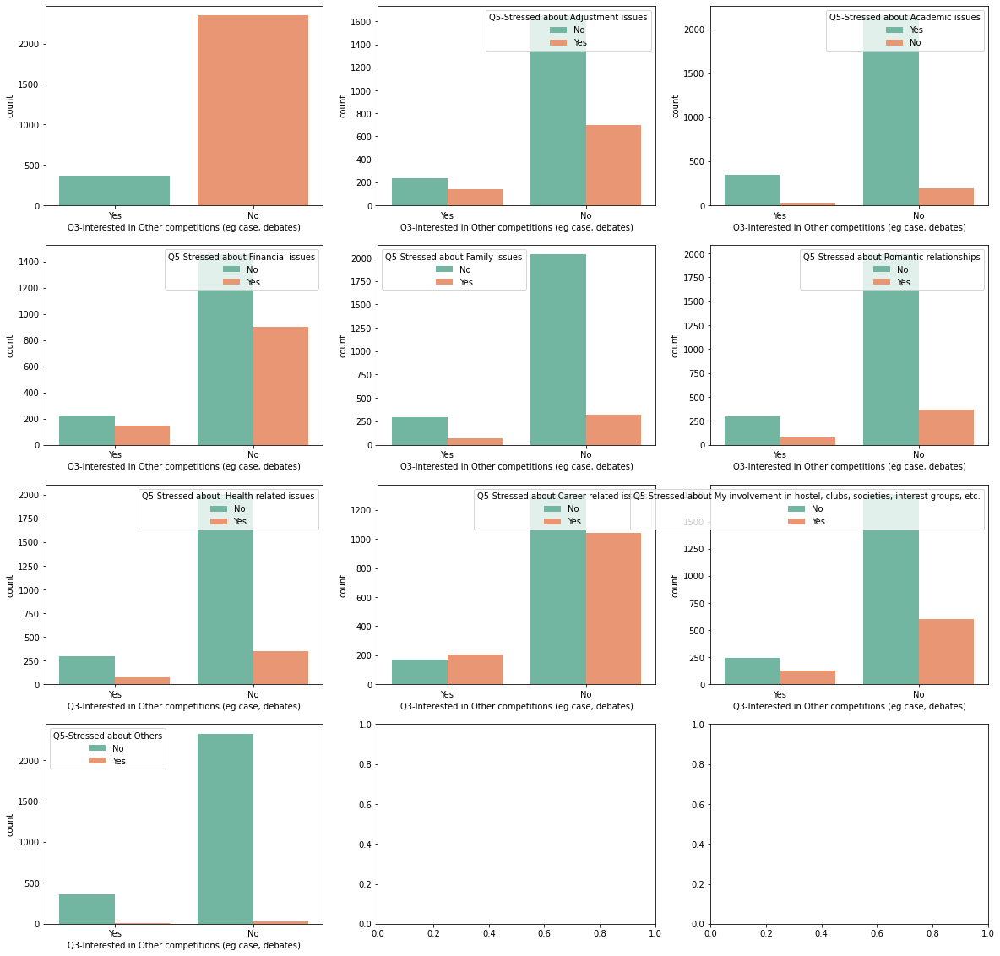

In [186]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q3-Interested in Other competitions (eg case, debates)', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q3-Interested in Other competitions (eg case, debates)', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q3-Interested in Other competitions (eg case, debates)', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q3-Interested in Other competitions (eg case, debates)', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q3-Interested in Other competitions (eg case, debates)', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q3-Interested in Other competitions (eg case, debates)', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q3-Interested in Other competitions (eg case, debates)', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q3-Interested in Other competitions (eg case, debates)', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q3-Interested in Other competitions (eg case, debates)', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q3-Interested in Other competitions (eg case, debates)', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



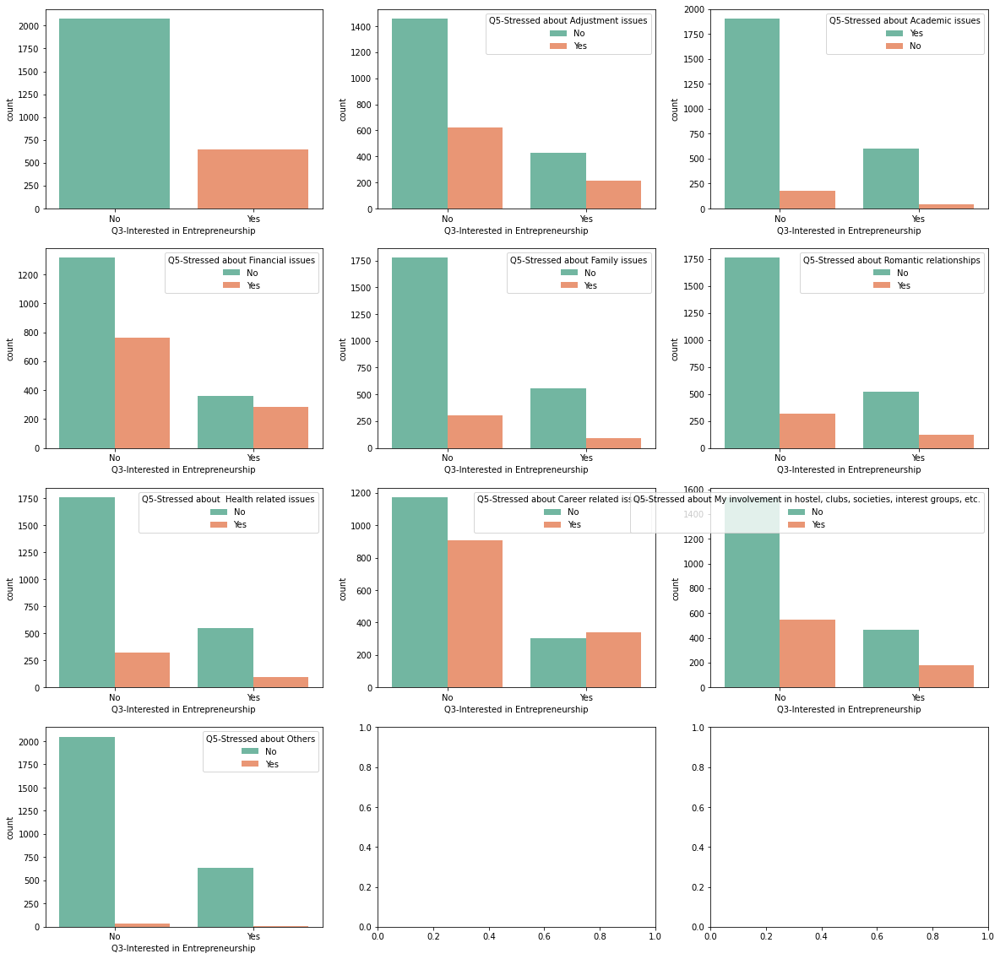

In [187]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q3-Interested in Entrepreneurship', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q3-Interested in Entrepreneurship', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q3-Interested in Entrepreneurship', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q3-Interested in Entrepreneurship', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q3-Interested in Entrepreneurship', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q3-Interested in Entrepreneurship', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q3-Interested in Entrepreneurship', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q3-Interested in Entrepreneurship', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q3-Interested in Entrepreneurship', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q3-Interested in Entrepreneurship', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



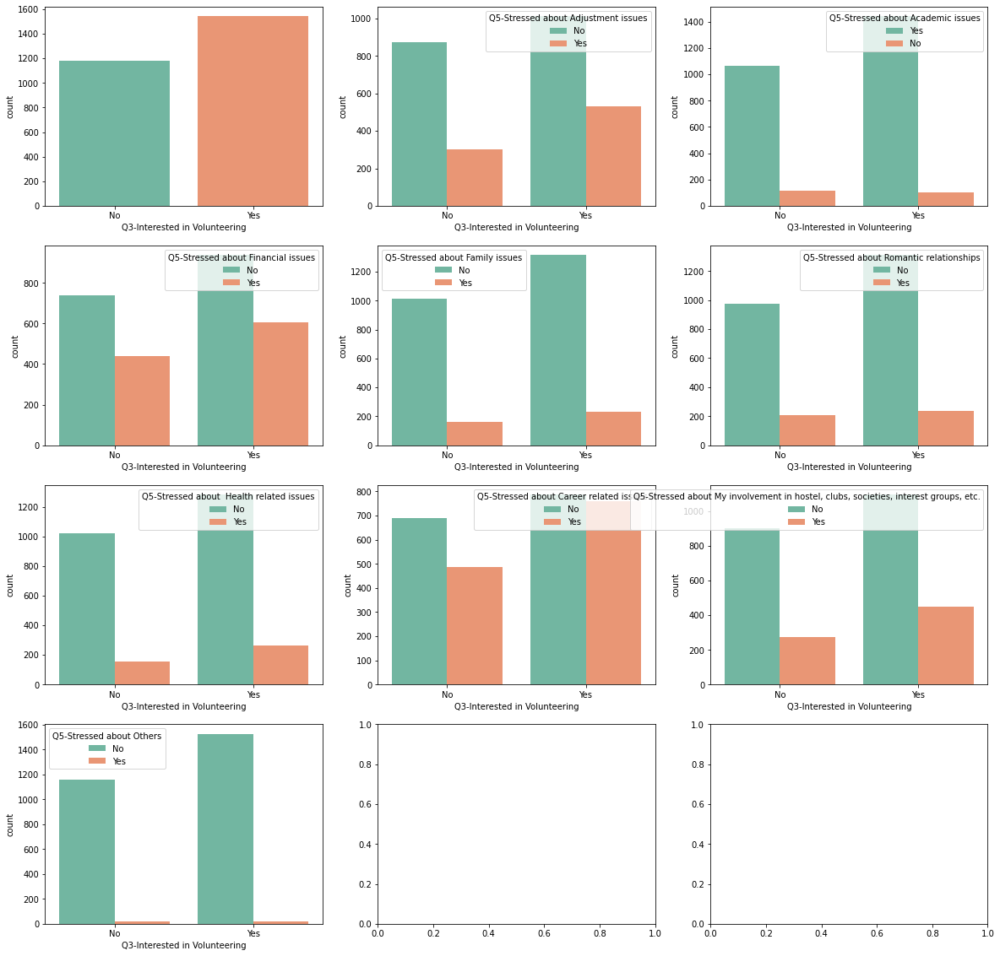

In [188]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q3-Interested in Volunteering', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q3-Interested in Volunteering', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q3-Interested in Volunteering', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q3-Interested in Volunteering', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q3-Interested in Volunteering', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q3-Interested in Volunteering', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q3-Interested in Volunteering', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q3-Interested in Volunteering', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q3-Interested in Volunteering', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q3-Interested in Volunteering', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



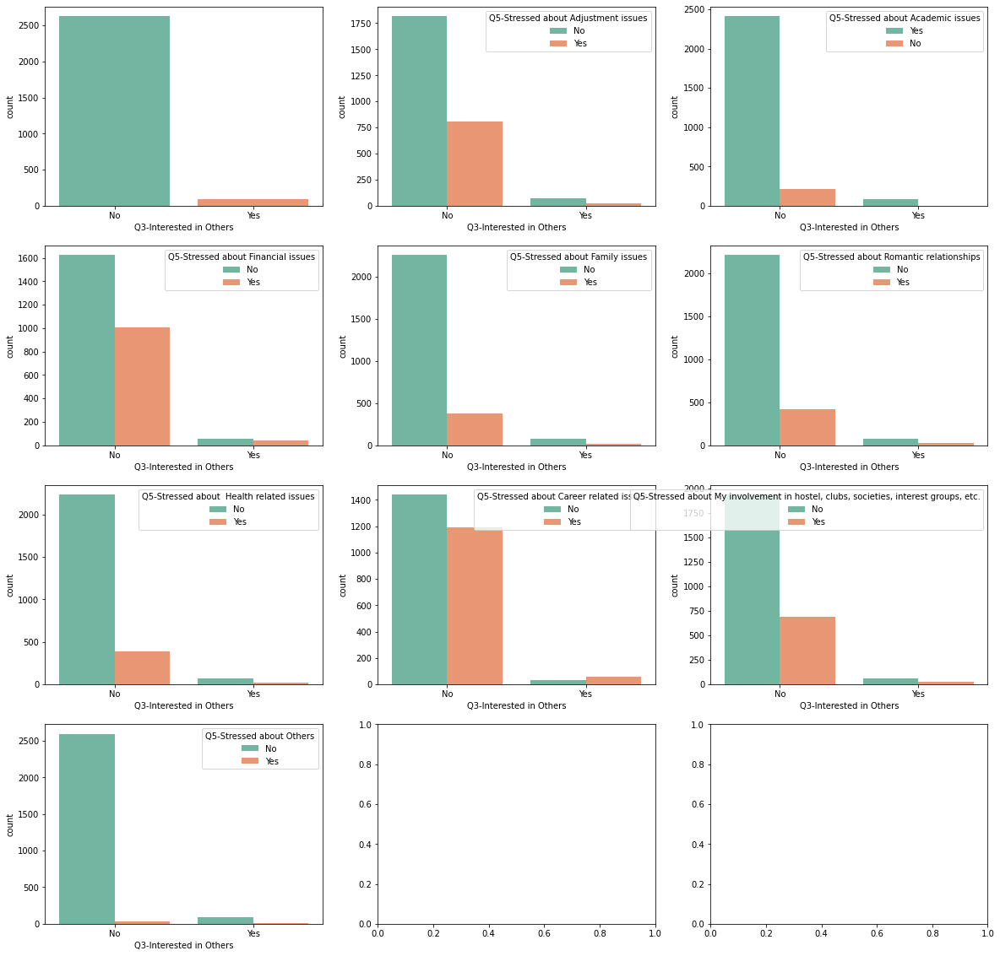

In [189]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q3-Interested in Others', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q3-Interested in Others', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q3-Interested in Others', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q3-Interested in Others', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q3-Interested in Others', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q3-Interested in Others', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q3-Interested in Others', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q3-Interested in Others', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q3-Interested in Others', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q3-Interested in Others', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



### Compare passion with stress

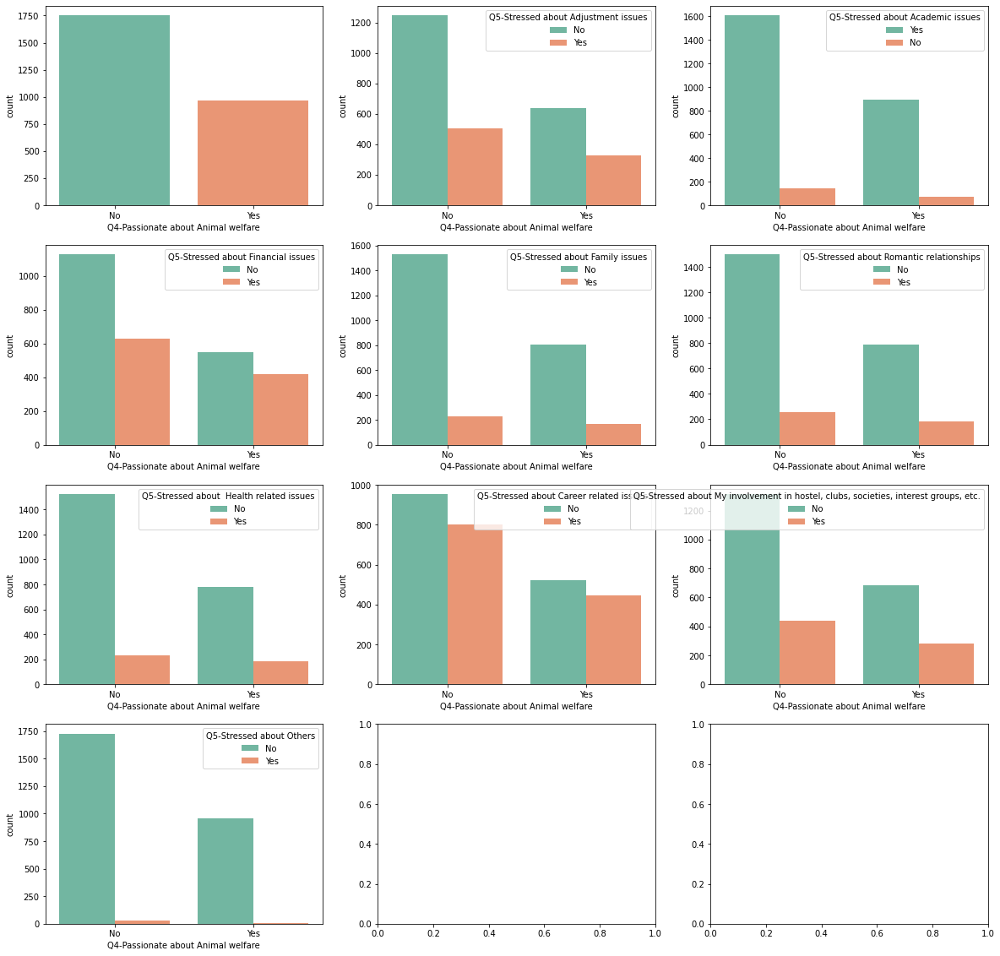

In [190]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q4-Passionate about Animal welfare', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q4-Passionate about Animal welfare', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q4-Passionate about Animal welfare', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q4-Passionate about Animal welfare', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q4-Passionate about Animal welfare', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q4-Passionate about Animal welfare', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q4-Passionate about Animal welfare', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q4-Passionate about Animal welfare', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q4-Passionate about Animal welfare', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q4-Passionate about Animal welfare', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()


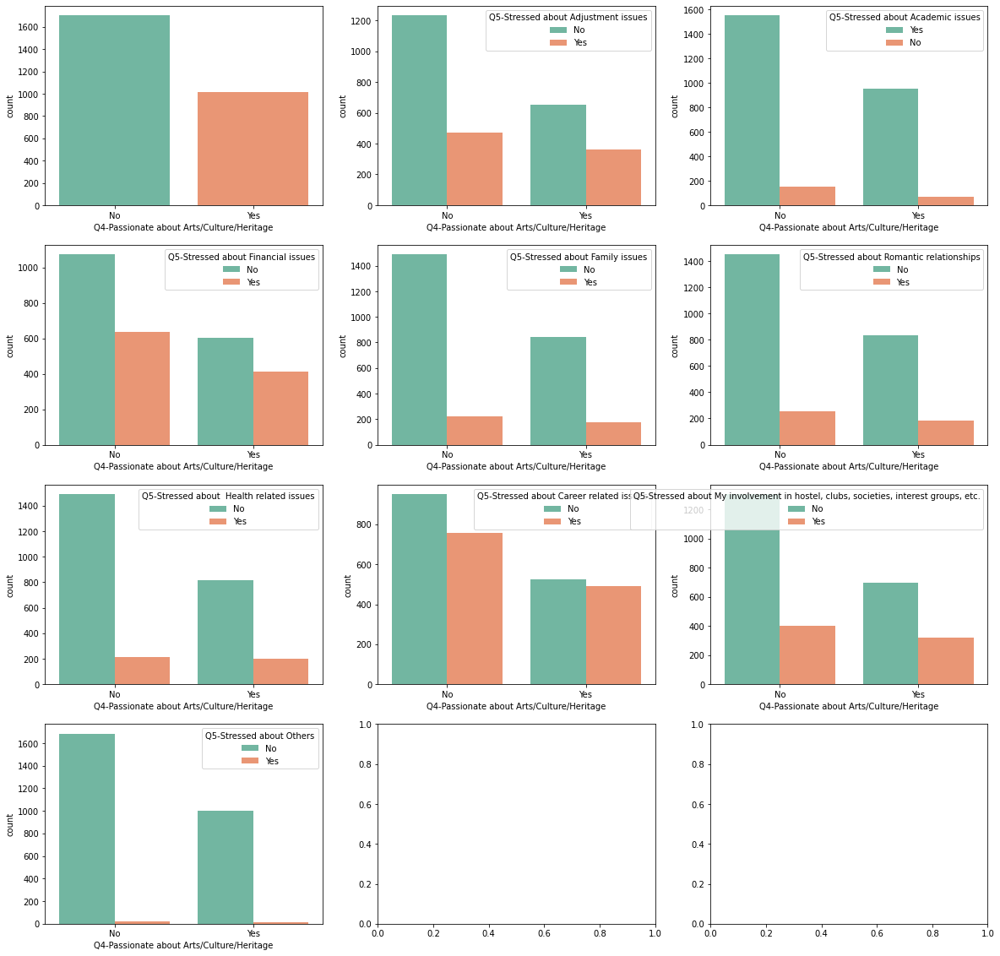

In [191]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q4-Passionate about Arts/Culture/Heritage', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q4-Passionate about Arts/Culture/Heritage', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q4-Passionate about Arts/Culture/Heritage', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q4-Passionate about Arts/Culture/Heritage', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q4-Passionate about Arts/Culture/Heritage', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q4-Passionate about Arts/Culture/Heritage', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q4-Passionate about Arts/Culture/Heritage', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q4-Passionate about Arts/Culture/Heritage', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q4-Passionate about Arts/Culture/Heritage', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q4-Passionate about Arts/Culture/Heritage', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()

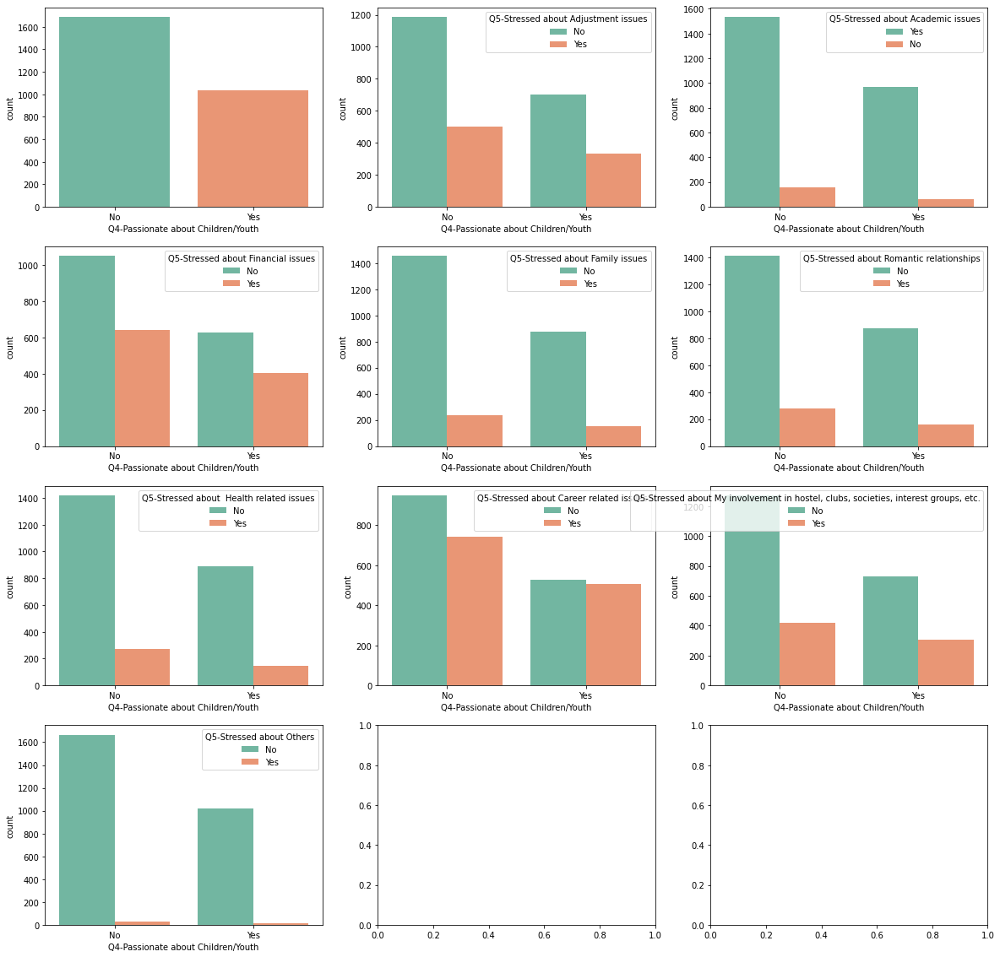

In [192]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q4-Passionate about Children/Youth', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q4-Passionate about Children/Youth', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q4-Passionate about Children/Youth', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q4-Passionate about Children/Youth', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q4-Passionate about Children/Youth', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q4-Passionate about Children/Youth', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q4-Passionate about Children/Youth', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q4-Passionate about Children/Youth', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q4-Passionate about Children/Youth', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q4-Passionate about Children/Youth', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()


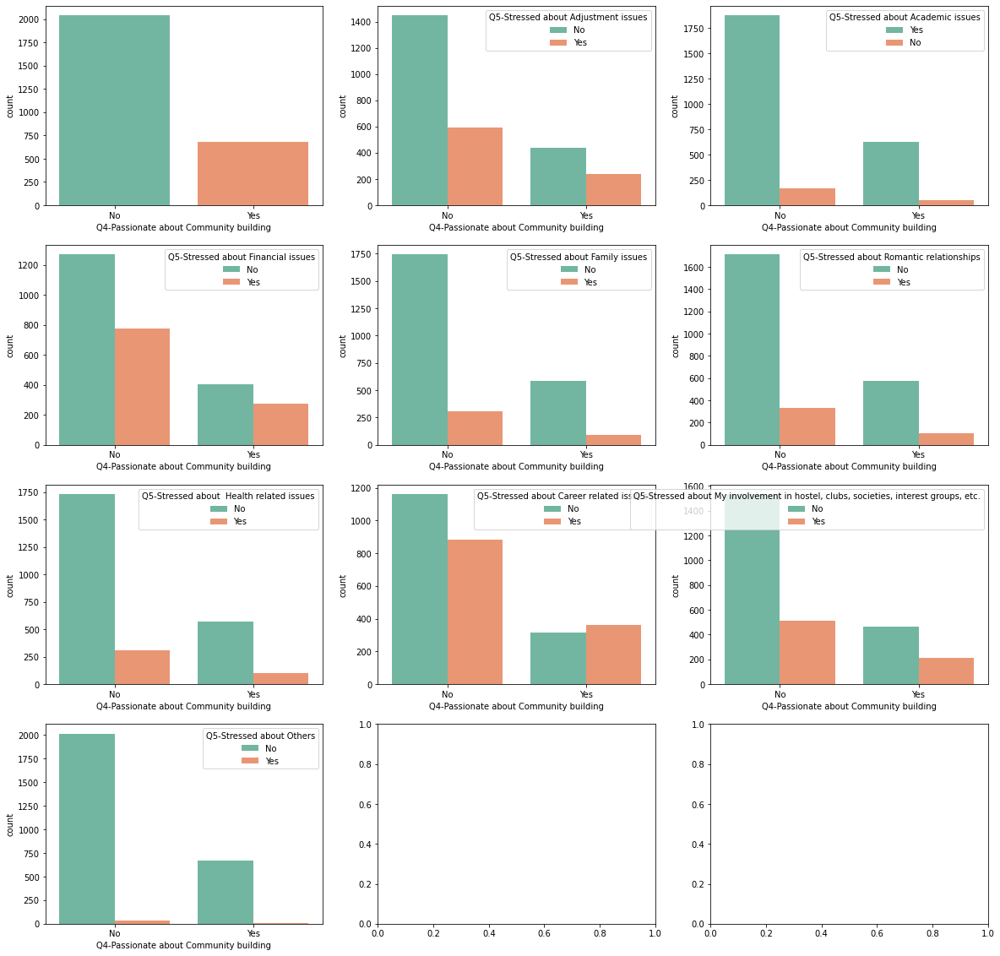

In [193]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q4-Passionate about Community building', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q4-Passionate about Community building', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q4-Passionate about Community building', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q4-Passionate about Community building', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q4-Passionate about Community building', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q4-Passionate about Community building', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q4-Passionate about Community building', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q4-Passionate about Community building', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q4-Passionate about Community building', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q4-Passionate about Community building', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



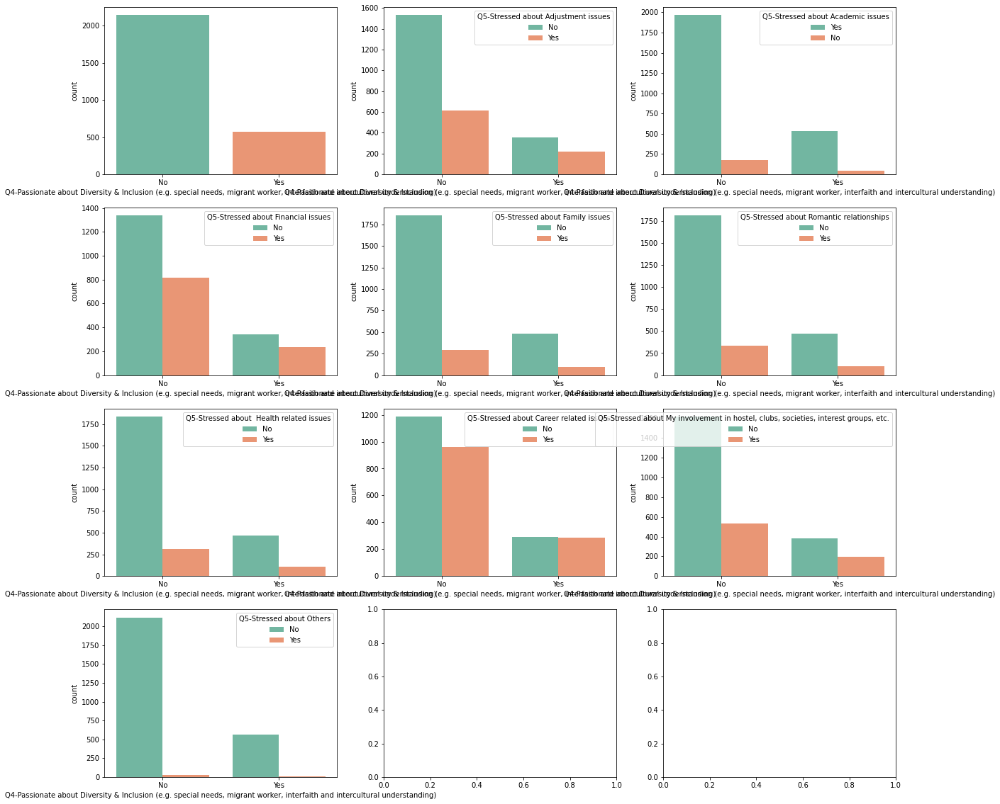

In [194]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q4-Passionate about Diversity & Inclusion (e.g. special needs, migrant worker, interfaith and intercultural understanding)', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q4-Passionate about Diversity & Inclusion (e.g. special needs, migrant worker, interfaith and intercultural understanding)', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q4-Passionate about Diversity & Inclusion (e.g. special needs, migrant worker, interfaith and intercultural understanding)', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q4-Passionate about Diversity & Inclusion (e.g. special needs, migrant worker, interfaith and intercultural understanding)', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q4-Passionate about Diversity & Inclusion (e.g. special needs, migrant worker, interfaith and intercultural understanding)', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q4-Passionate about Diversity & Inclusion (e.g. special needs, migrant worker, interfaith and intercultural understanding)', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q4-Passionate about Diversity & Inclusion (e.g. special needs, migrant worker, interfaith and intercultural understanding)', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q4-Passionate about Diversity & Inclusion (e.g. special needs, migrant worker, interfaith and intercultural understanding)', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q4-Passionate about Diversity & Inclusion (e.g. special needs, migrant worker, interfaith and intercultural understanding)', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q4-Passionate about Diversity & Inclusion (e.g. special needs, migrant worker, interfaith and intercultural understanding)', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



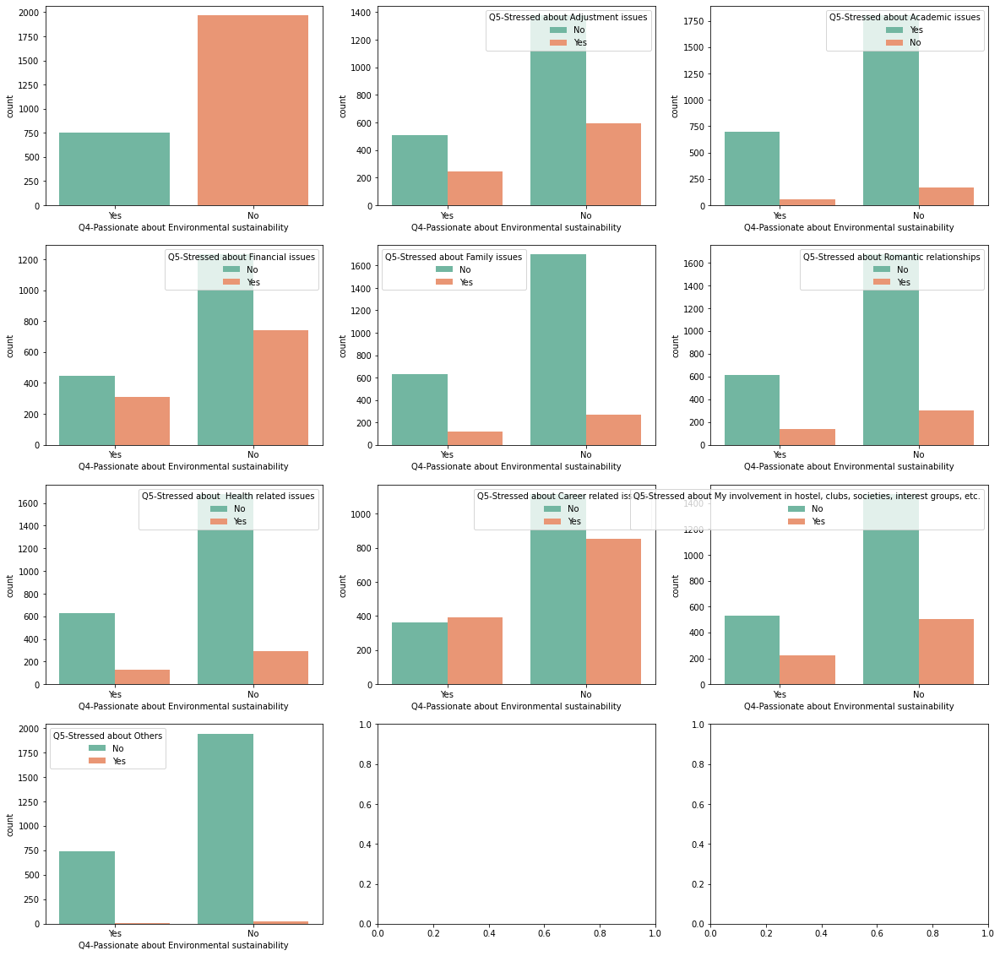

In [195]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q4-Passionate about Environmental sustainability', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q4-Passionate about Environmental sustainability', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q4-Passionate about Environmental sustainability', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q4-Passionate about Environmental sustainability', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q4-Passionate about Environmental sustainability', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q4-Passionate about Environmental sustainability', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q4-Passionate about Environmental sustainability', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q4-Passionate about Environmental sustainability', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q4-Passionate about Environmental sustainability', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q4-Passionate about Environmental sustainability', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



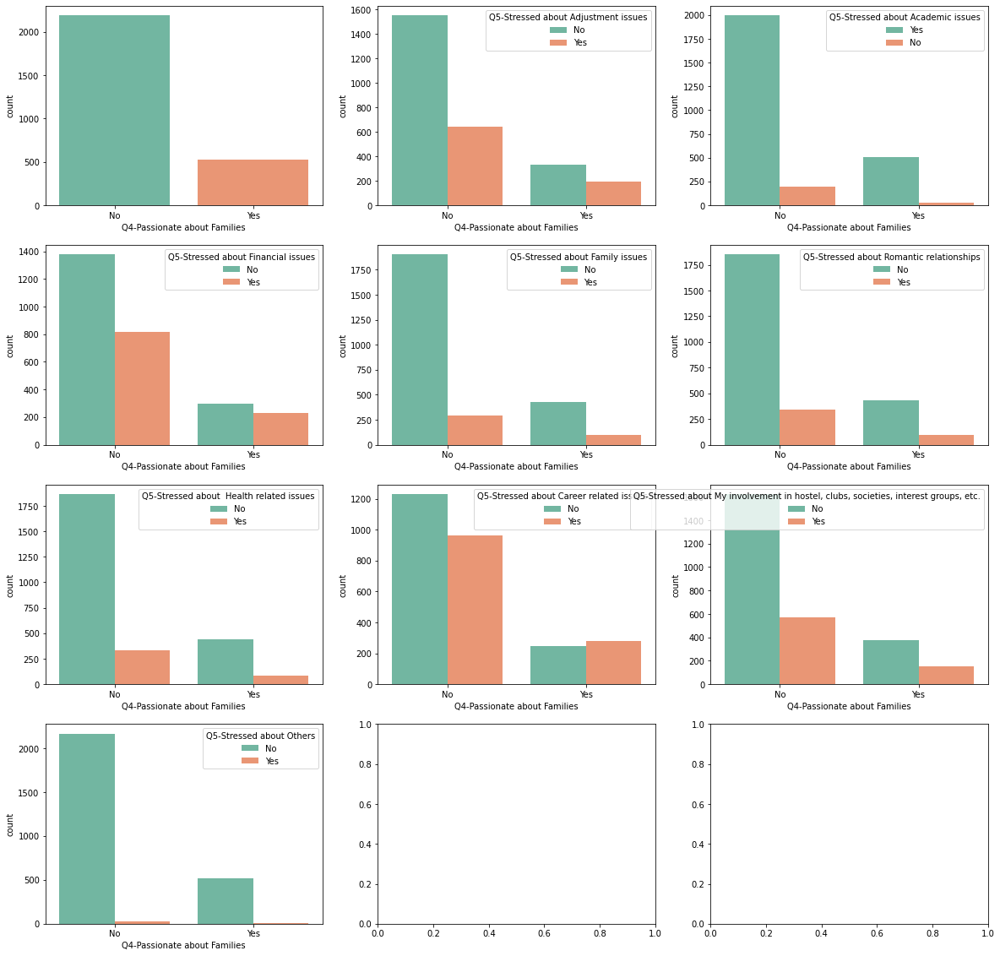

In [196]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q4-Passionate about Families', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q4-Passionate about Families', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q4-Passionate about Families', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q4-Passionate about Families', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q4-Passionate about Families', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q4-Passionate about Families', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q4-Passionate about Families', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q4-Passionate about Families', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q4-Passionate about Families', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q4-Passionate about Families', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



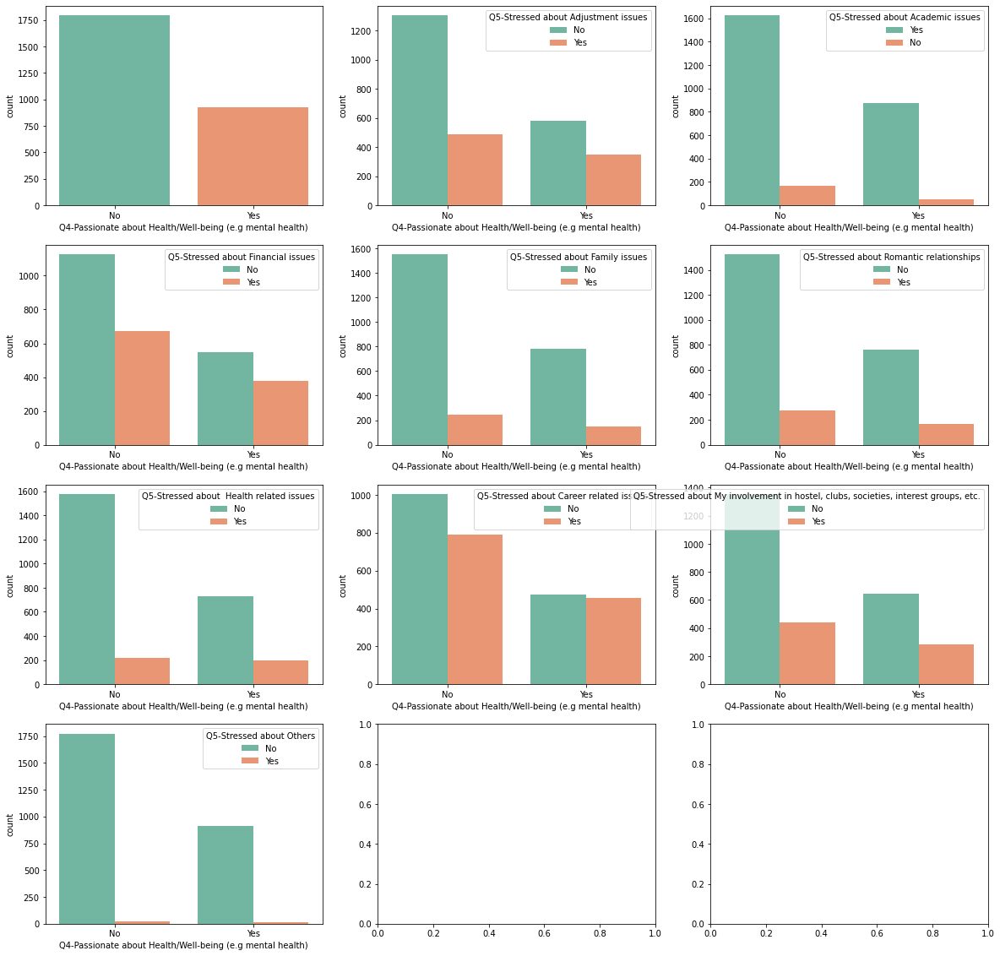

In [197]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q4-Passionate about Health/Well-being (e.g mental health)', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q4-Passionate about Health/Well-being (e.g mental health)', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q4-Passionate about Health/Well-being (e.g mental health)', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q4-Passionate about Health/Well-being (e.g mental health)', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q4-Passionate about Health/Well-being (e.g mental health)', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q4-Passionate about Health/Well-being (e.g mental health)', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q4-Passionate about Health/Well-being (e.g mental health)', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q4-Passionate about Health/Well-being (e.g mental health)', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q4-Passionate about Health/Well-being (e.g mental health)', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q4-Passionate about Health/Well-being (e.g mental health)', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



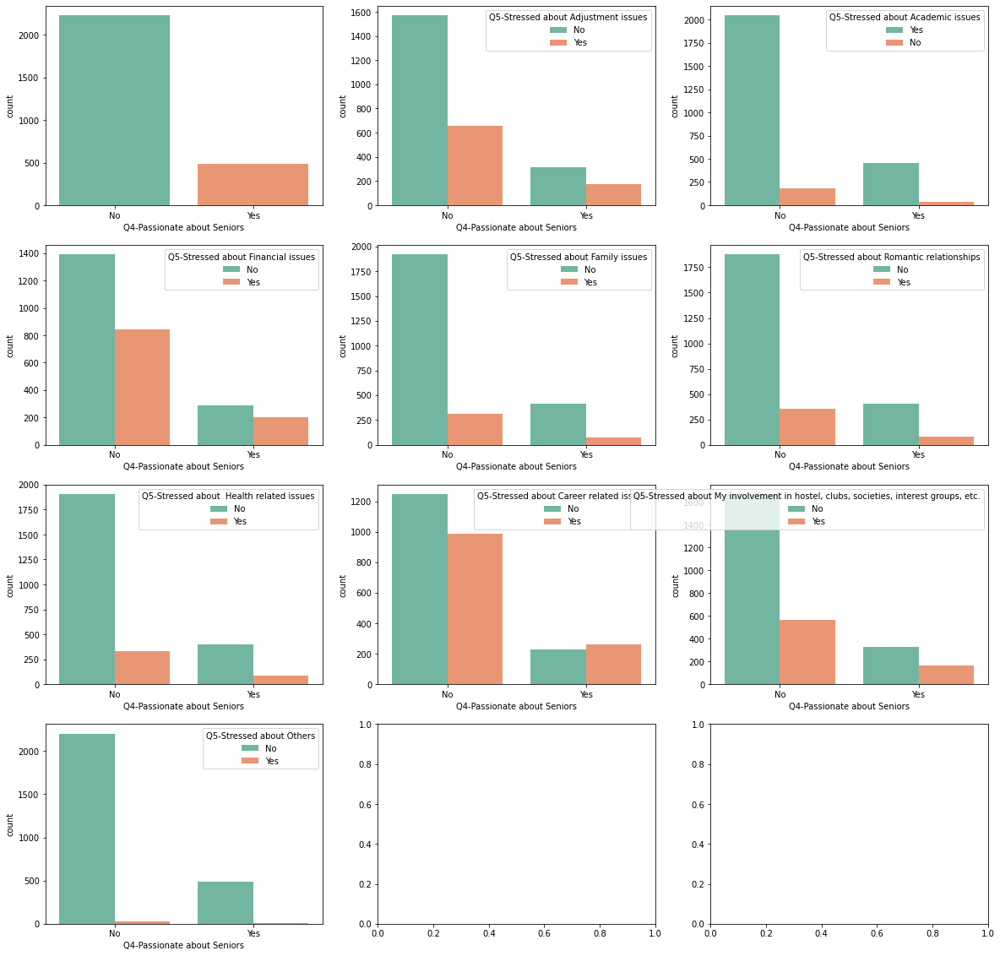

In [198]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q4-Passionate about Seniors', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q4-Passionate about Seniors', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q4-Passionate about Seniors', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q4-Passionate about Seniors', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q4-Passionate about Seniors', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q4-Passionate about Seniors', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q4-Passionate about Seniors', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q4-Passionate about Seniors', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q4-Passionate about Seniors', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q4-Passionate about Seniors', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



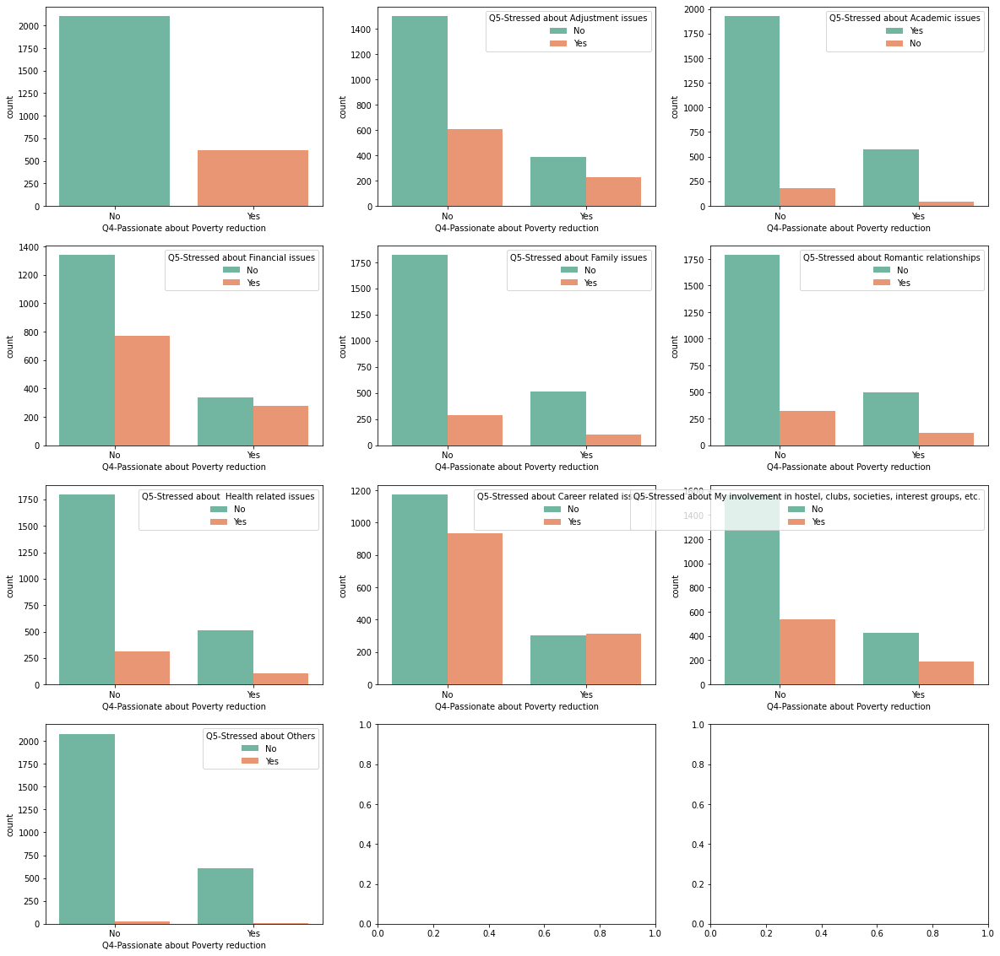

In [199]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q4-Passionate about Poverty reduction', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q4-Passionate about Poverty reduction', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q4-Passionate about Poverty reduction', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q4-Passionate about Poverty reduction', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q4-Passionate about Poverty reduction', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q4-Passionate about Poverty reduction', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q4-Passionate about Poverty reduction', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q4-Passionate about Poverty reduction', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q4-Passionate about Poverty reduction', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q4-Passionate about Poverty reduction', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



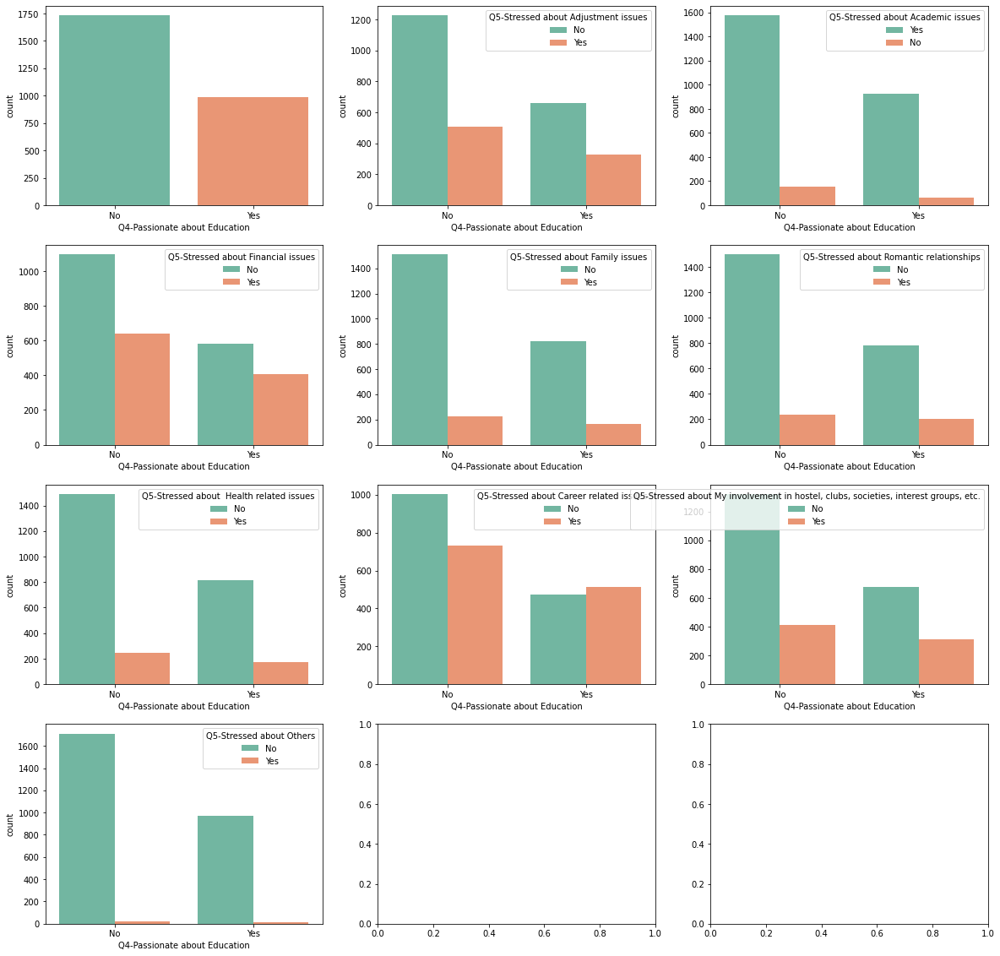

In [200]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q4-Passionate about Education', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q4-Passionate about Education', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q4-Passionate about Education', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q4-Passionate about Education', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q4-Passionate about Education', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q4-Passionate about Education', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q4-Passionate about Education', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q4-Passionate about Education', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q4-Passionate about Education', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q4-Passionate about Education', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



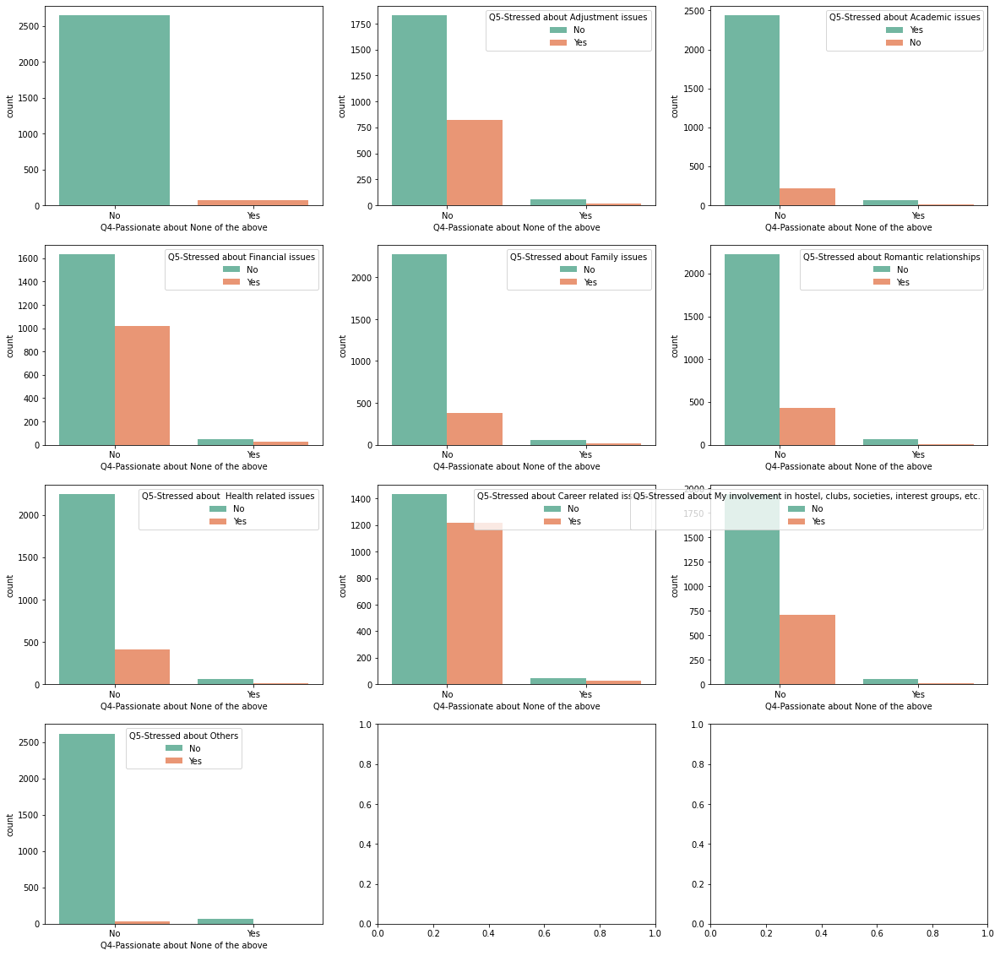

In [201]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q4-Passionate about None of the above', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q4-Passionate about None of the above', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q4-Passionate about None of the above', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q4-Passionate about None of the above', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q4-Passionate about None of the above', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q4-Passionate about None of the above', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q4-Passionate about None of the above', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q4-Passionate about None of the above', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q4-Passionate about None of the above', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q4-Passionate about None of the above', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



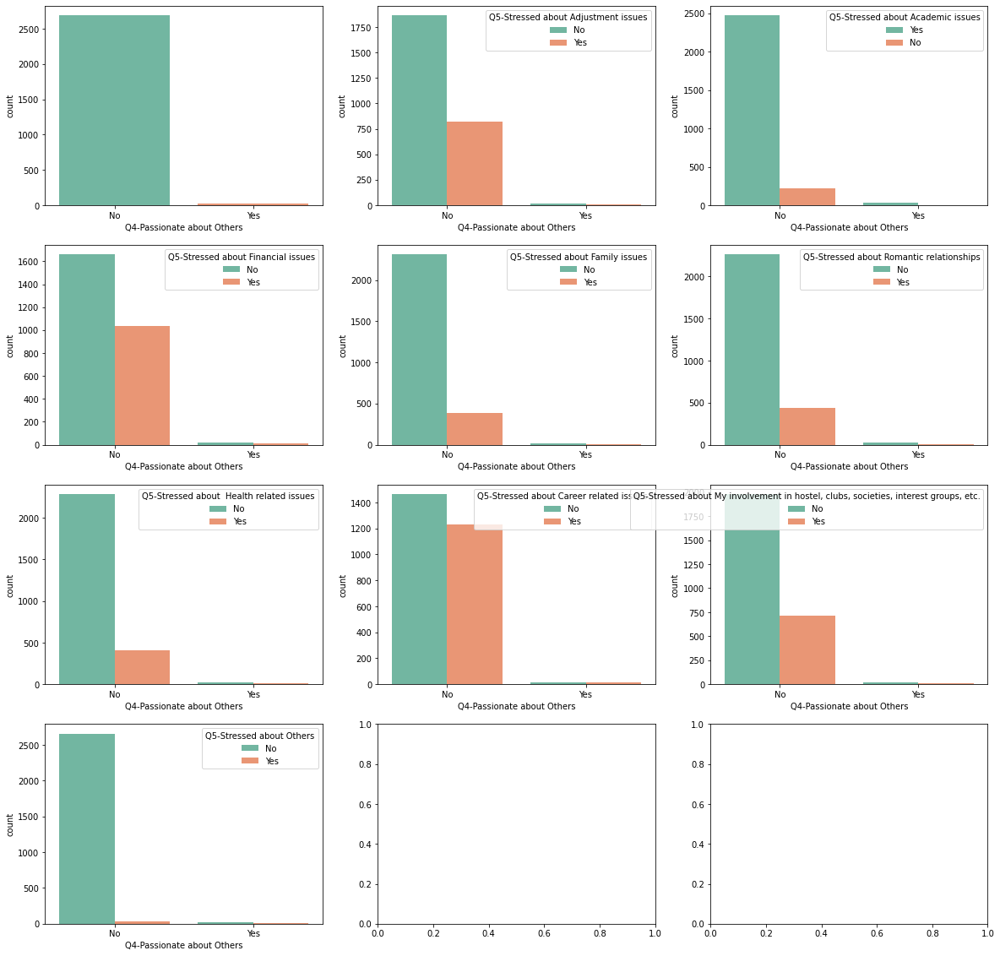

In [202]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.countplot(x ='Q4-Passionate about Others', data = dataset, palette = "Set2", ax=ax[0,0])
sns.countplot(x ='Q4-Passionate about Others', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.countplot(x ='Q4-Passionate about Others', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.countplot(x ='Q4-Passionate about Others', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.countplot(x ='Q4-Passionate about Others', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.countplot(x ='Q4-Passionate about Others', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.countplot(x ='Q4-Passionate about Others', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.countplot(x ='Q4-Passionate about Others', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.countplot(x ='Q4-Passionate about Others', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.countplot(x ='Q4-Passionate about Others', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



### Compare your voluntering with stress

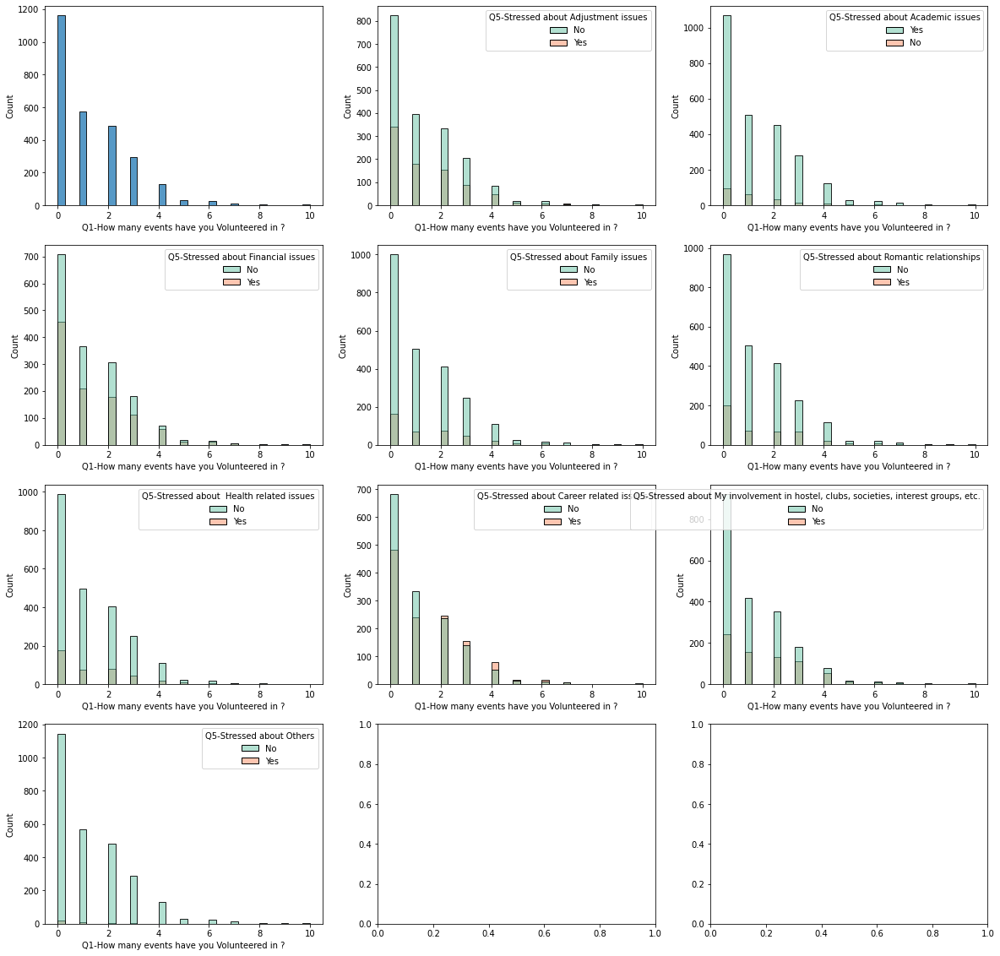

In [208]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))

sns.histplot(x ='Q1-How many events have you Volunteered in ?', data = dataset, palette = "Set2", ax=ax[0,0])
sns.histplot(x ='Q1-How many events have you Volunteered in ?', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.histplot(x ='Q1-How many events have you Volunteered in ?', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.histplot(x ='Q1-How many events have you Volunteered in ?', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.histplot(x ='Q1-How many events have you Volunteered in ?', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.histplot(x ='Q1-How many events have you Volunteered in ?', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.histplot(x ='Q1-How many events have you Volunteered in ?', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.histplot(x ='Q1-How many events have you Volunteered in ?', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.histplot(x ='Q1-How many events have you Volunteered in ?', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.histplot(x ='Q1-How many events have you Volunteered in ?', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



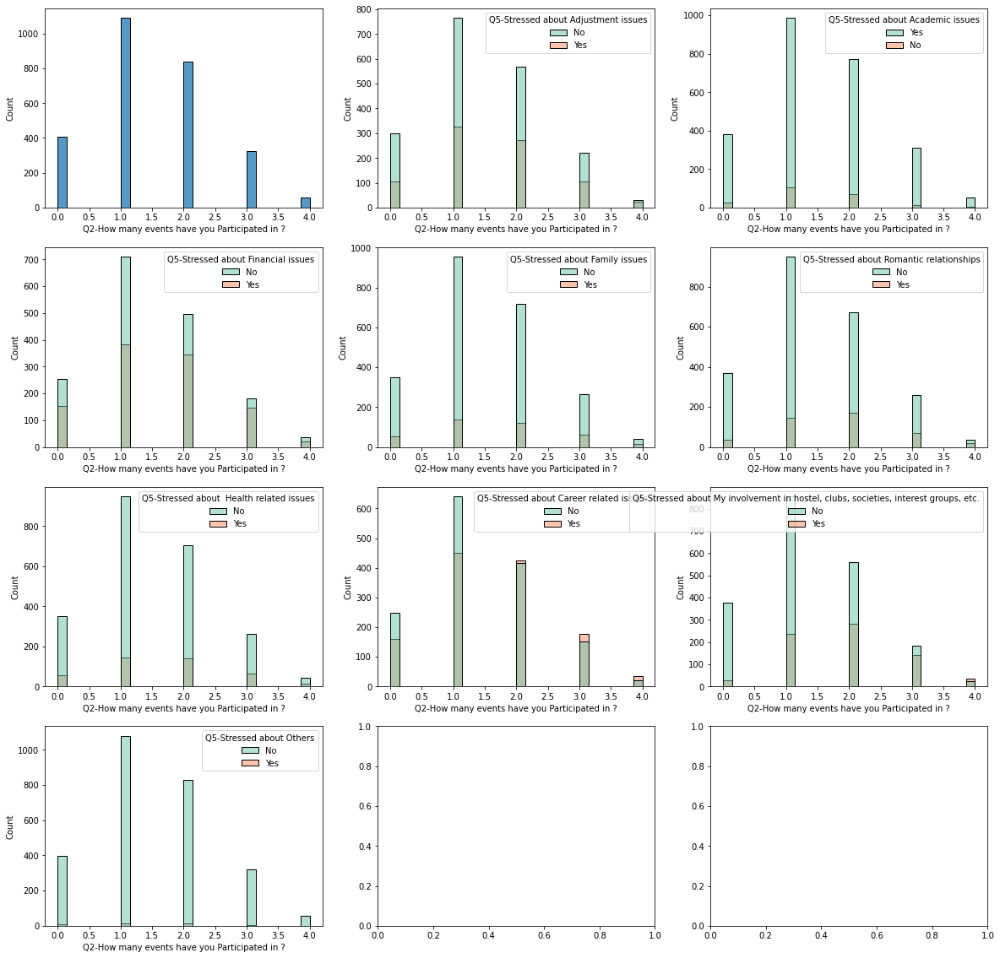

In [209]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))

sns.histplot(x ='Q2-How many events have you Participated in ?', data = dataset, palette = "Set2", ax=ax[0,0])
sns.histplot(x ='Q2-How many events have you Participated in ?', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.histplot(x ='Q2-How many events have you Participated in ?', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.histplot(x ='Q2-How many events have you Participated in ?', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.histplot(x ='Q2-How many events have you Participated in ?', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.histplot(x ='Q2-How many events have you Participated in ?', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.histplot(x ='Q2-How many events have you Participated in ?', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.histplot(x ='Q2-How many events have you Participated in ?', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.histplot(x ='Q2-How many events have you Participated in ?', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.histplot(x ='Q2-How many events have you Participated in ?', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



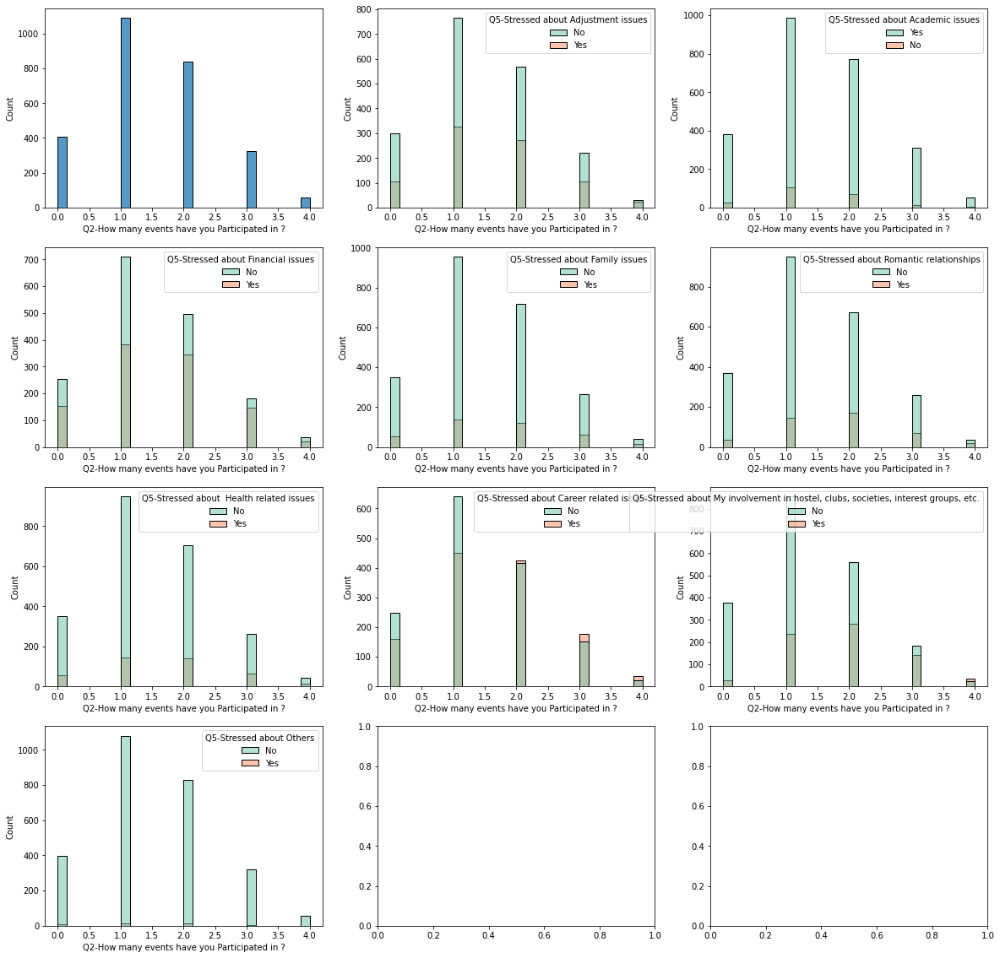

In [218]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))

sns.histplot(x ='Q2-How many events have you Participated in ?', data = dataset, palette = "Set2", ax=ax[0,0])
sns.histplot(x ='Q2-How many events have you Participated in ?', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.histplot(x ='Q2-How many events have you Participated in ?', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.histplot(x ='Q2-How many events have you Participated in ?', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.histplot(x ='Q2-How many events have you Participated in ?', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.histplot(x ='Q2-How many events have you Participated in ?', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.histplot(x ='Q2-How many events have you Participated in ?', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.histplot(x ='Q2-How many events have you Participated in ?', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.histplot(x ='Q2-How many events have you Participated in ?', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.histplot(x ='Q2-How many events have you Participated in ?', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



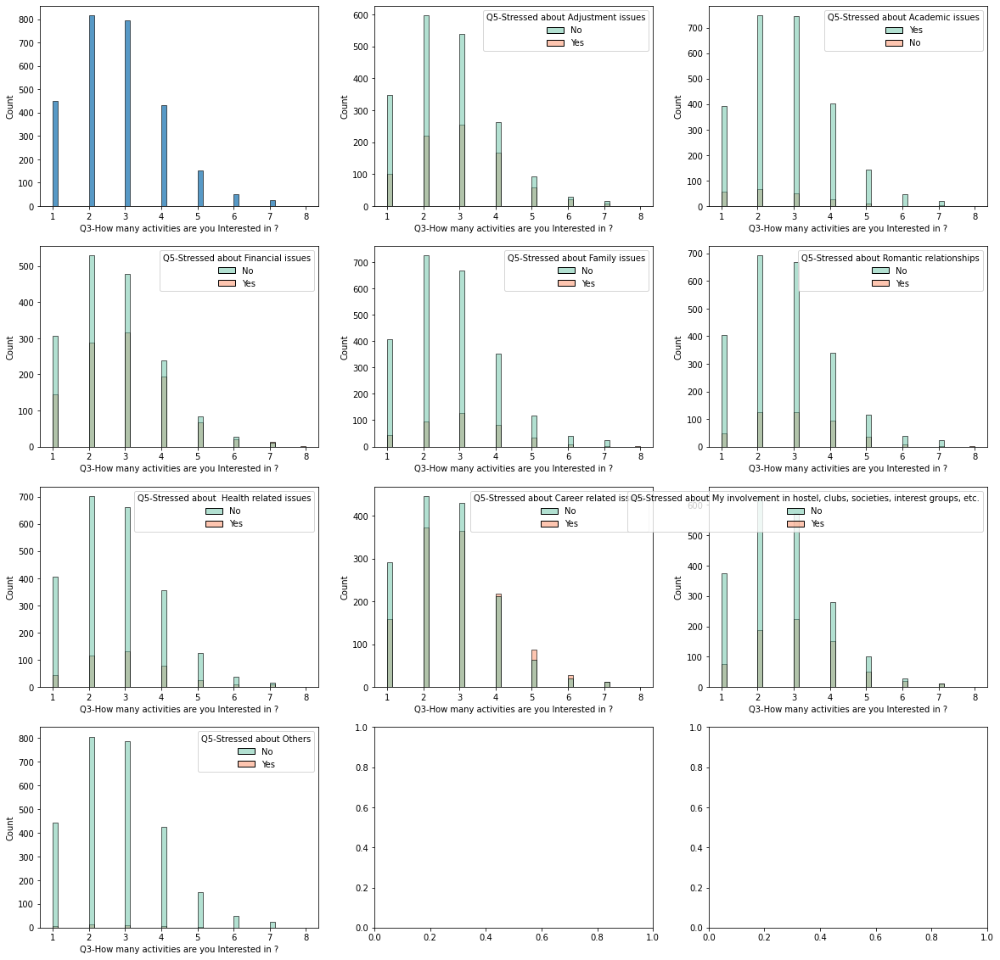

In [210]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.histplot(x ='Q3-How many activities are you Interested in ?', data = dataset, palette = "Set2", ax=ax[0,0])
sns.histplot(x ='Q3-How many activities are you Interested in ?', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.histplot(x ='Q3-How many activities are you Interested in ?', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.histplot(x ='Q3-How many activities are you Interested in ?', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.histplot(x ='Q3-How many activities are you Interested in ?', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.histplot(x ='Q3-How many activities are you Interested in ?', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.histplot(x ='Q3-How many activities are you Interested in ?', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.histplot(x ='Q3-How many activities are you Interested in ?', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.histplot(x ='Q3-How many activities are you Interested in ?', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.histplot(x ='Q3-How many activities are you Interested in ?', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



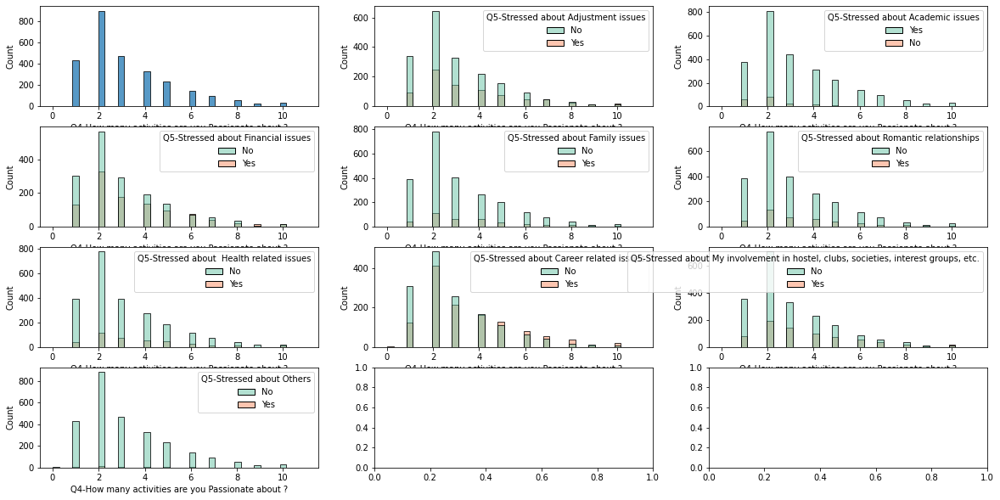

In [211]:
fig, ax = plt.subplots(4,3, figsize=(20, 2
0))
sns.histplot(x ='Q4-How many activities are you Passionate about ?', data = dataset, palette = "Set2", ax=ax[0,0])
sns.histplot(x ='Q4-How many activities are you Passionate about ?', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.histplot(x ='Q4-How many activities are you Passionate about ?', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.histplot(x ='Q4-How many activities are you Passionate about ?', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.histplot(x ='Q4-How many activities are you Passionate about ?', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.histplot(x ='Q4-How many activities are you Passionate about ?', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.histplot(x ='Q4-How many activities are you Passionate about ?', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.histplot(x ='Q4-How many activities are you Passionate about ?', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.histplot(x ='Q4-How many activities are you Passionate about ?', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.histplot(x ='Q4-How many activities are you Passionate about ?', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



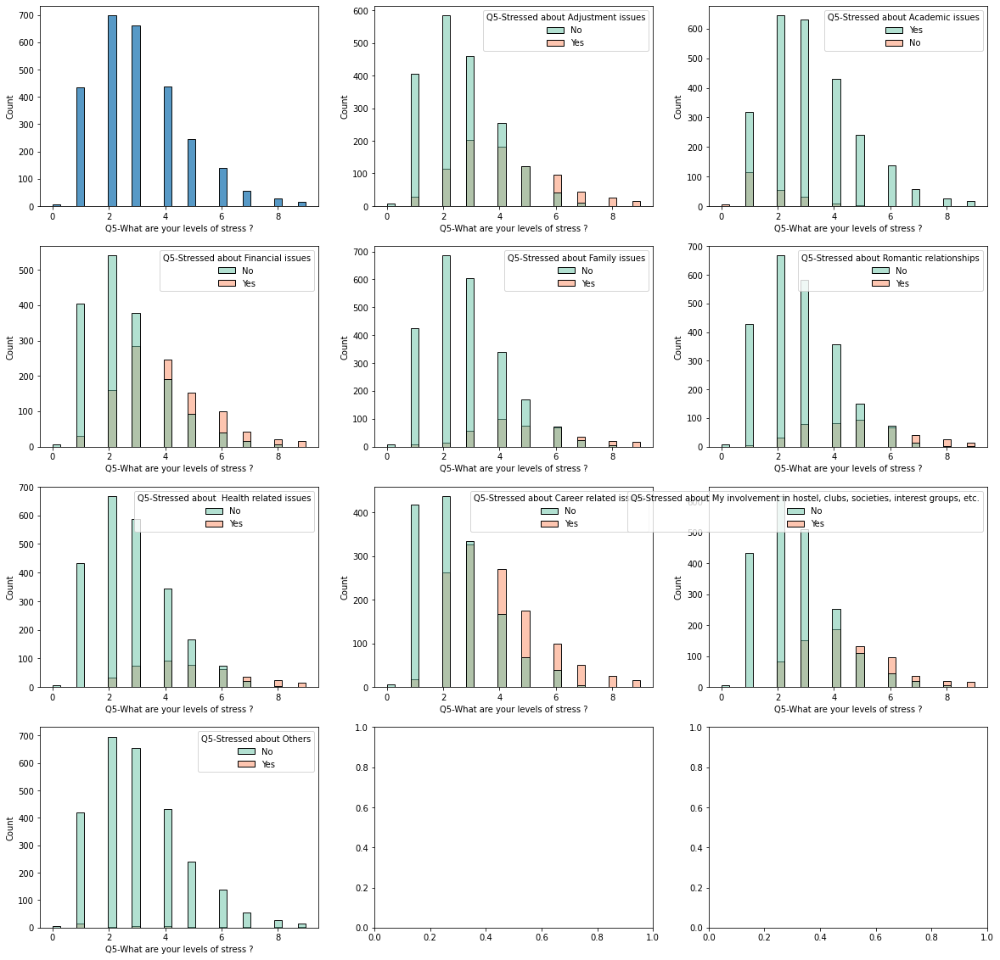

In [213]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.histplot(x ='Q5-What are your levels of stress ?', data = dataset, palette = "Set2", ax=ax[0,0])
sns.histplot(x ='Q5-What are your levels of stress ?', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.histplot(x ='Q5-What are your levels of stress ?', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.histplot(x ='Q5-What are your levels of stress ?', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.histplot(x ='Q5-What are your levels of stress ?', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.histplot(x ='Q5-What are your levels of stress ?', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.histplot(x ='Q5-What are your levels of stress ?', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.histplot(x ='Q5-What are your levels of stress ?', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.histplot(x ='Q5-What are your levels of stress ?', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.histplot(x ='Q5-What are your levels of stress ?', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



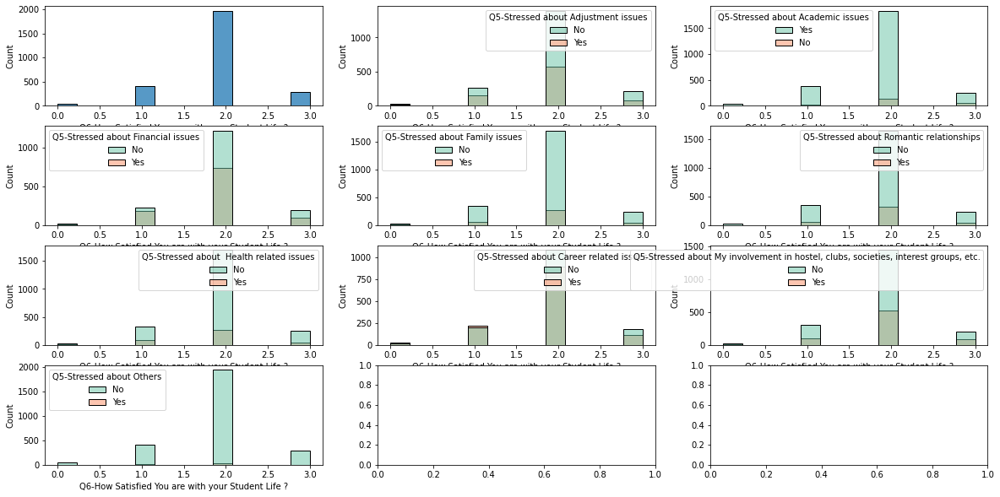

In [212]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.histplot(x ='Q6-How Satisfied You are with your Student Life ?', data = dataset, palette = "Set2", ax=ax[0,0])
sns.histplot(x ='Q6-How Satisfied You are with your Student Life ?', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.histplot(x ='Q6-How Satisfied You are with your Student Life ?', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.histplot(x ='Q6-How Satisfied You are with your Student Life ?', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.histplot(x ='Q6-How Satisfied You are with your Student Life ?', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.histplot(x ='Q6-How Satisfied You are with your Student Life ?', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.histplot(x ='Q6-How Satisfied You are with your Student Life ?', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.histplot(x ='Q6-How Satisfied You are with your Student Life ?', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.histplot(x ='Q6-How Satisfied You are with your Student Life ?', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.histplot(x ='Q6-How Satisfied You are with your Student Life ?', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



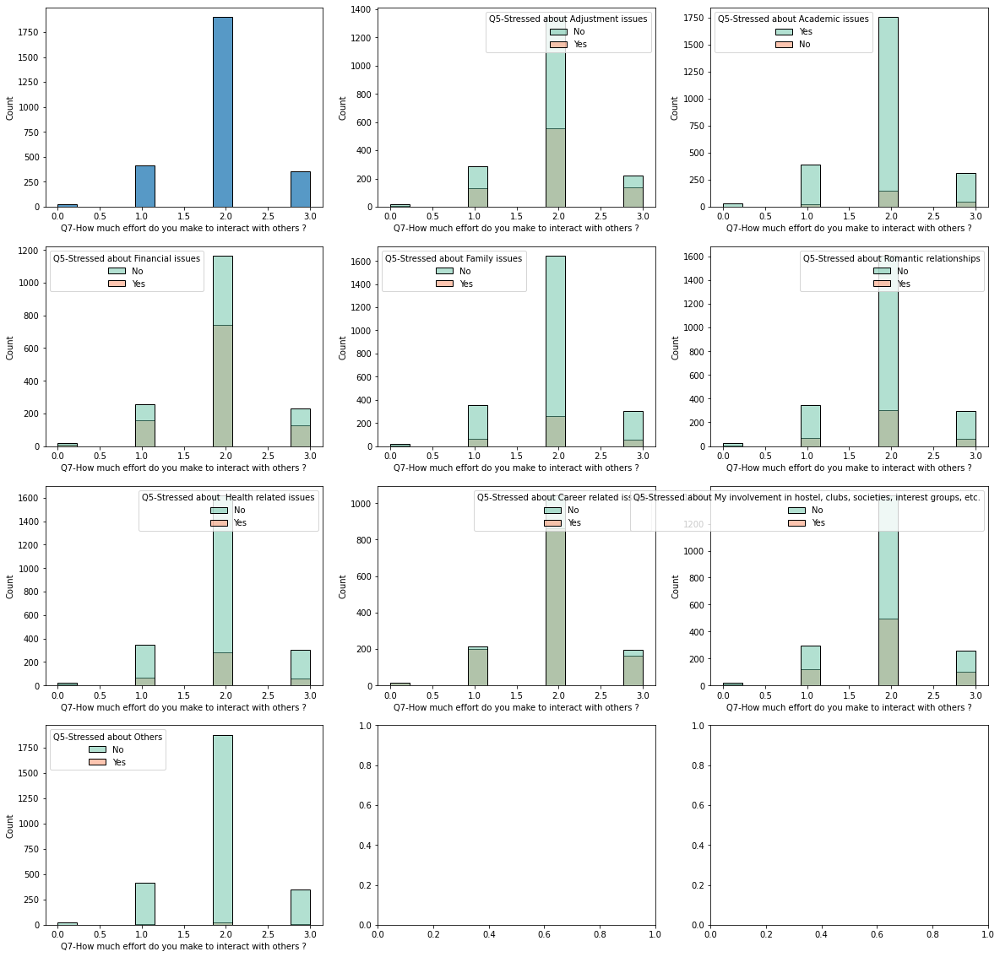

In [217]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.histplot(x ='Q7-How much effort do you make to interact with others ?', data = dataset, palette = "Set2", ax=ax[0,0])
sns.histplot(x ='Q7-How much effort do you make to interact with others ?', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.histplot(x ='Q7-How much effort do you make to interact with others ?', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.histplot(x ='Q7-How much effort do you make to interact with others ?', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.histplot(x ='Q7-How much effort do you make to interact with others ?', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.histplot(x ='Q7-How much effort do you make to interact with others ?', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.histplot(x ='Q7-How much effort do you make to interact with others ?', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.histplot(x ='Q7-How much effort do you make to interact with others ?', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.histplot(x ='Q7-How much effort do you make to interact with others ?', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.histplot(x ='Q7-How much effort do you make to interact with others ?', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()



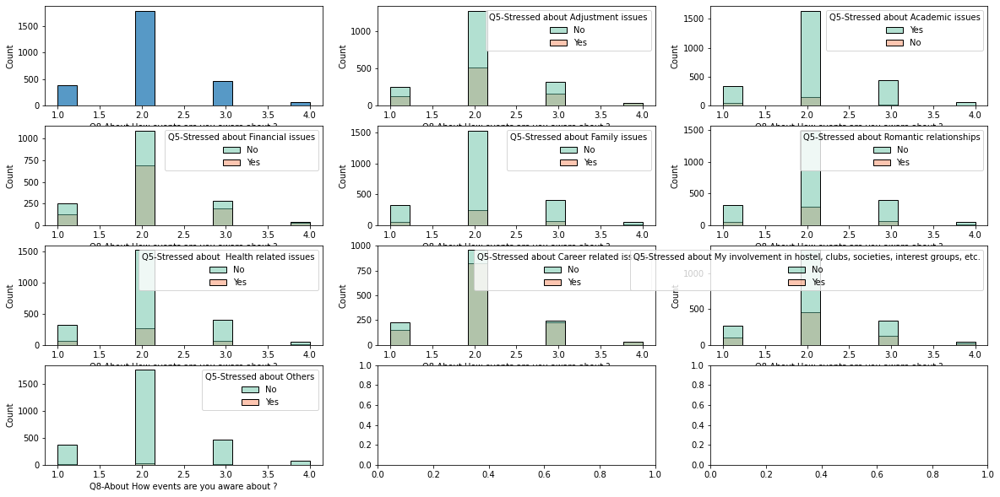

In [215]:
fig, ax = plt.subplots(4,3, figsize=(20, 20))
sns.histplot(x ='Q8-About How events are you aware about ?', data = dataset, palette = "Set2", ax=ax[0,0])
sns.histplot(x ='Q8-About How events are you aware about ?', hue = "Q5-Stressed about Adjustment issues", data = dataset, palette = "Set2", ax=ax[0,1])
sns.histplot(x ='Q8-About How events are you aware about ?', hue = "Q5-Stressed about Academic issues", data = dataset, palette = "Set2", ax=ax[0, 2])
sns.histplot(x ='Q8-About How events are you aware about ?', hue = "Q5-Stressed about Financial issues", data = dataset, palette = "Set2", ax=ax[1, 0])
sns.histplot(x ='Q8-About How events are you aware about ?', hue = "Q5-Stressed about Family issues", data = dataset, palette = "Set2", ax=ax[1, 1])
sns.histplot(x ='Q8-About How events are you aware about ?', hue = "Q5-Stressed about Romantic relationships", data = dataset, palette = "Set2", ax=ax[1, 2])
sns.histplot(x ='Q8-About How events are you aware about ?', hue = "Q5-Stressed about  Health related issues", data = dataset, palette = "Set2", ax=ax[2, 0])
sns.histplot(x ='Q8-About How events are you aware about ?', hue = "Q5-Stressed about Career related issues", data = dataset, palette = "Set2", ax=ax[2,1])
sns.histplot(x ='Q8-About How events are you aware about ?', hue = "Q5-Stressed about My involvement in hostel, clubs, societies, interest groups, etc.", data = dataset, palette = "Set2", ax=ax[2,2])
sns.histplot(x ='Q8-About How events are you aware about ?', hue = "Q5-Stressed about Others", data = dataset, palette = "Set2", ax=ax[3,0])

plt.show()
plt.close()

### End